# Advanced enhancer code analysis

In this notebook we will go over some advanced enhancer code analysis based on patterns found using tfmodisco-lite.

This notebook builds further upon the analysis in the tutorial titled "Enhancer code analysis".

In [1]:
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import crested
from memelite import tomtom
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import anndata

2025-05-16 10:01:58.750824: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-16 10:01:58.765464: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747382518.777975 3406255 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747382518.781514 3406255 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747382518.791285 3406255 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
%matplotlib inline

Load the model, later this will be used to calculate attribution scores.

In [3]:
import keras

model_path = (
    "../../../crested_notebooks/mouse_biccn/finetuned_model/checkpoints/02.keras"
)
model = keras.models.load_model(model_path, compile=False)

I0000 00:00:1747382530.571852 3406255 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 78790 MB memory:  -> device: 0, name: NVIDIA H100 80GB HBM3, pci bus id: 0000:68:00.0, compute capability: 9.0
E0000 00:00:1747382531.090527 3406768 ptx_compiler_helpers.cc:88] *** WARNING *** Invoking ptxas with version 12.5.82, which corresponds to a CUDA version <=12.6.2. CUDA versions 12.x.y up to and including 12.6.2 miscompile certain edge cases around clamping.
Please upgrade to CUDA 12.6.3 or newer.


Load the AnnData set to link class-indexes of the model to actual cell types.

In [4]:
adata = anndata.read_h5ad("../../../crested_notebooks/mouse_cortex_filtered.h5ad")

## Load patterns

We will start by loading the patterns identified in the previous tutorial.

Here, it is important to specify the same window size as was used to identify the patterns in the first place using tfmodisco-lite.
We will use the actual genomic location of all instances of the pattern lateron, for this reason it's important to know what part of the
original one hot encoded sequence was used. This is defined using the window size.

Setting `class_name` to `None` will load patterns for all cell types (by matching based on the regex: `(.+?)_oh\.npz$`).
It's also possible to provide a list of cell types instead.

In [5]:
pattern_names, patterns = crested.tl.modisco.load_patterns(
    "../../../crested_notebooks/modisco_results_ft_2000/", window=1000, class_names=None
)

2025-05-16T10:02:16.672186+0200 INFO No class names provided, using all found in the contribution directory: ['Astro', 'Endo', 'L2_3IT', 'L5ET', 'L5IT', 'L5_6NP', 'L6CT', 'L6IT', 'L6b', 'Lamp5', 'Micro_PVM', 'OPC', 'Oligo', 'Pvalb', 'Sncg', 'Sst', 'SstChodl', 'VLMC', 'Vip']
2025-05-16T10:02:16.672576+0200 INFO Loading Astro ...


2025-05-16T10:02:21.069113+0200 INFO Loading Endo ...
2025-05-16T10:02:23.490334+0200 INFO Loading L2_3IT ...
2025-05-16T10:02:26.738317+0200 INFO Loading L5ET ...
2025-05-16T10:02:29.147231+0200 INFO Loading L5IT ...
2025-05-16T10:02:32.194729+0200 INFO Loading L5_6NP ...
2025-05-16T10:02:34.327718+0200 INFO Loading L6CT ...
2025-05-16T10:02:36.647259+0200 INFO Loading L6IT ...
2025-05-16T10:02:39.756458+0200 INFO Loading L6b ...
2025-05-16T10:02:42.058926+0200 INFO Loading Lamp5 ...
2025-05-16T10:02:44.383854+0200 INFO Loading Micro_PVM ...
2025-05-16T10:02:47.934148+0200 INFO Loading OPC ...
2025-05-16T10:02:52.080255+0200 INFO Loading Oligo ...
2025-05-16T10:02:56.685716+0200 INFO Loading Pvalb ...
2025-05-16T10:02:58.455979+0200 INFO Loading Sncg ...
2025-05-16T10:03:00.320075+0200 INFO Loading Sst ...
2025-05-16T10:03:02.580066+0200 INFO Loading SstChodl ...
2025-05-16T10:03:05.082849+0200 INFO Loading VLMC ...
2025-05-16T10:03:08.192970+0200 INFO Loading Vip ...


## Calculate pairwise pattern similarity

In [6]:
len(pattern_names)

354

tfmodisco-lite found a total of **354 patterns** across all classes.
Probably many patterns are very similar to each other, to assess this we will calculate the pattern-to-pattern similarities for each pair of patterns and perform clustering analysis.

To remove non-informative flanks of patterns, we will trim each pattern based on information content (IC).

In [7]:
ic_threshold = 0.2

In [8]:
pvals, scores, offsets, overlaps, strands = tomtom(
    Qs=[p.ppm[slice(*p.ic_trim(ic_threshold))].T for p in patterns],
    Ts=[p.ppm[slice(*p.ic_trim(ic_threshold))].T for p in patterns],
)

Offset is larger than `n_cache`. Please increase `n_cache` to at least  9999999


## Cluster patterns based on pairwise similarity

Next, we will use SCanpy to visualize the pairwise similarity matrix using tSNE dimensionality reduction and perform clustering using the Leiden algorithm.

In [9]:
pattern_adata = sc.AnnData(
    X=np.nan_to_num(-np.log10(pvals + 1e-10)),
    obs=pd.DataFrame(
        index=pattern_names,
        data={
            "cell_type": [
                n.split("_pos")[0] if "pos" in n else n.split("_neg")[0]
                for n in pattern_names
            ],
            "ic_start": [p.ic_trim(ic_threshold)[0] for p in patterns],
            "ic_end": [p.ic_trim(ic_threshold)[1] for p in patterns],
            "ic_mean": [p.ic().mean() for p in patterns],
            "log_n_seqlets": [np.log(len(p.seqlets)) for p in patterns],
        },
    ),
)
pattern_adata.layers["offsets"] = offsets
pattern_adata.layers["strands"] = strands

/tmp/ipykernel_3406255/3449328314.py:2: RuntimeWarning: invalid value encountered in log10
  X = np.nan_to_num(-np.log10(pvals + 1e-10)),


In [10]:
pattern_adata

AnnData object with n_obs × n_vars = 354 × 354
    obs: 'cell_type', 'ic_start', 'ic_end', 'ic_mean', 'log_n_seqlets'
    layers: 'offsets', 'strands'

In [11]:
pattern_adata.obs["trimmed_length"] = (
    pattern_adata.obs.ic_end - pattern_adata.obs.ic_start
)

In [12]:
sc.tl.pca(pattern_adata)
sc.pp.neighbors(pattern_adata)
sc.tl.tsne(pattern_adata)

/home/VIB.LOCAL/seppe.dewinter/sdewin/PhD/python_modules/CREsted/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Many patterns are shared across cell types

As you can see, multiple clusters of similar patterns are formed.

Also, clusters tend **not** to be cell type specific (i.e., most motifs are used by multiple cell types).

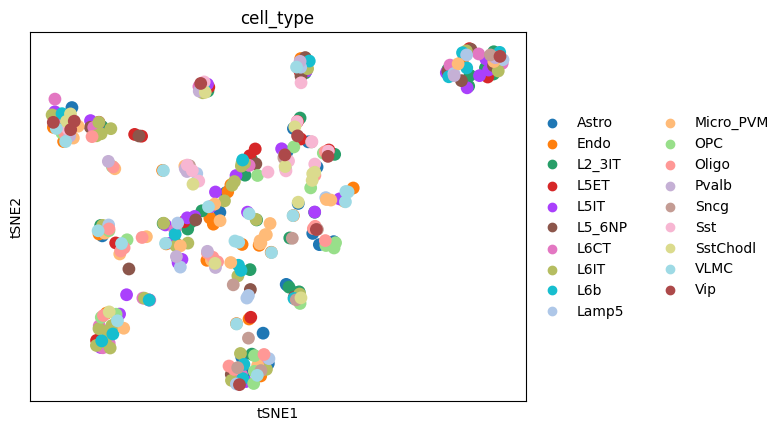

In [13]:
_ = sc.pl.tsne(pattern_adata, color="cell_type")

We can also visualize some metrics of each pattern.

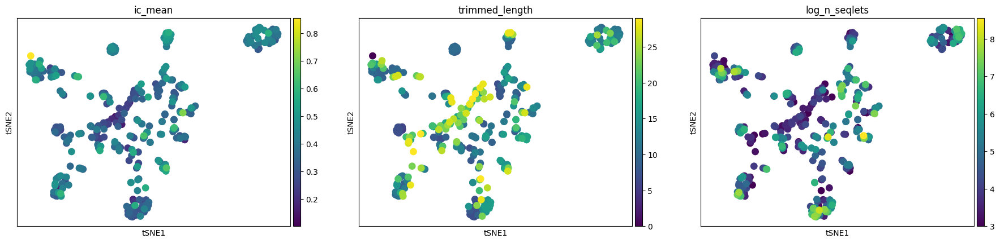

In [16]:
_ = sc.pl.tsne(pattern_adata, color=["ic_mean", "trimmed_length", "log_n_seqlets"])

Let's clusters the patterns using the Leiden algorithm.

You are free to use any other approach to clusters patterns based on similarity, but the leiden algorithm works reasonably well.

In [14]:
sc.tl.leiden(pattern_adata, flavor="igraph", resolution=3)

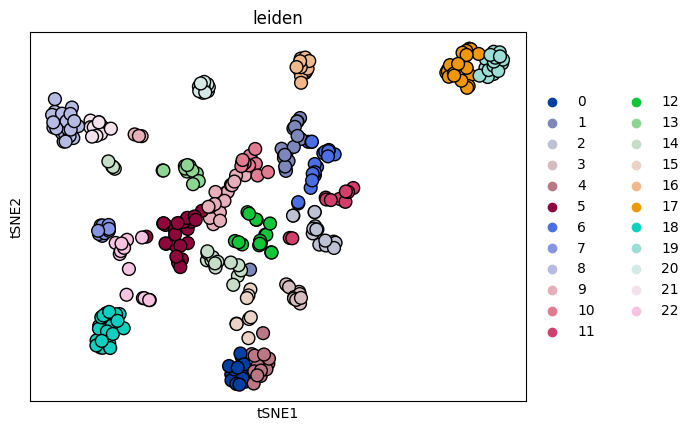

In [15]:
_ = sc.pl.tsne(pattern_adata, color="leiden", edgecolor="black")

## Determine which clusters to sub cluster

Using the dimensionality reduction we can see that we have some well defined clusters of patterns at the edges of the plot.

However, in the middle the clusters seem to be less well defined.

Next, we will calculate the average pattern similarity per cluster to determine wether it is worth to subcluster some clusters.

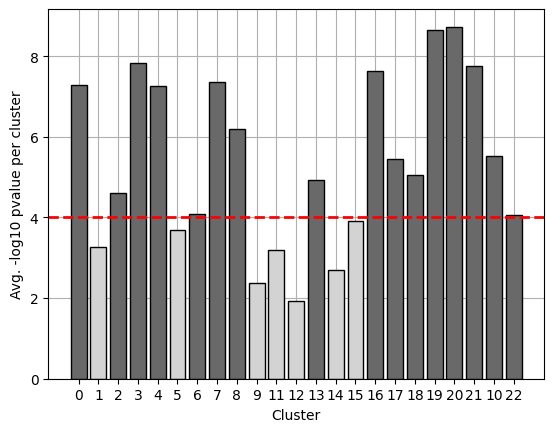

In [17]:
_threshold = 4
_values = [
    pattern_adata[pattern_adata.obs.leiden == c, pattern_adata.obs.leiden == c].X.mean()
    for c in pattern_adata.obs.leiden.unique()
]
fig, ax = plt.subplots()
ax.bar(
    x=np.arange(len(pattern_adata.obs.leiden.unique())),
    height=_values,
    color=["lightgray" if v < _threshold else "dimgray" for v in _values],
    edgecolor="black",
)
_ = ax.set_xticks(
    np.arange(len(pattern_adata.obs.leiden.unique())),
    labels=pattern_adata.obs.leiden.unique(),
)
_ = ax.set_xlabel("Cluster")
_ = ax.set_ylabel("Avg. -log10 pvalue per cluster")
_ = ax.axhline(_threshold, color="red", ls="dashed", lw=2)
ax.grid(True)
ax.set_axisbelow(True)
to_sub_cluster = [
    c for c, v in zip(pattern_adata.obs.leiden.unique(), _values) if v < _threshold
]

Some clusters indeed contain sets of patterns that are actually not that similar to each other, let's break these clusters down into smaller clusters.

## Perform sub clustering

In [18]:
pattern_adata.obs["sub_cluster"] = (
    pattern_adata.obs["leiden"].astype(int).astype(str).copy()
)

In [19]:
for cluster in to_sub_cluster:
    print(f"Cluster: {cluster}")
    _pattern_names = pattern_adata.obs_names[pattern_adata.obs.leiden == cluster]
    _pvals, _, _, _, _ = tomtom(
        Qs=[
            p.ppm[slice(*p.ic_trim(ic_threshold))].T
            for p, n in zip(patterns, pattern_names)
            if n in _pattern_names
        ],
        Ts=[
            p.ppm[slice(*p.ic_trim(ic_threshold))].T
            for p, n in zip(patterns, pattern_names)
            if n in _pattern_names
        ],
    )
    _pattern_adata = sc.AnnData(
        X=np.nan_to_num(-np.log10(_pvals + 1e-10)),
        obs=pd.DataFrame(index=_pattern_names),
    )
    sc.tl.pca(_pattern_adata)
    sc.pp.neighbors(_pattern_adata)
    sc.tl.leiden(_pattern_adata, flavor="igraph", resolution=2)
    pattern_adata.obs.loc[_pattern_names, "sub_cluster"] = [
        f"{c}.{sub_c}"
        for c, sub_c in zip(
            pattern_adata.obs.loc[_pattern_names, "sub_cluster"],
            _pattern_adata.obs.leiden,
        )
    ]

Cluster: 1
Cluster: 5
Cluster: 9
Cluster: 11
Cluster: 12
Cluster: 14
Cluster: 15


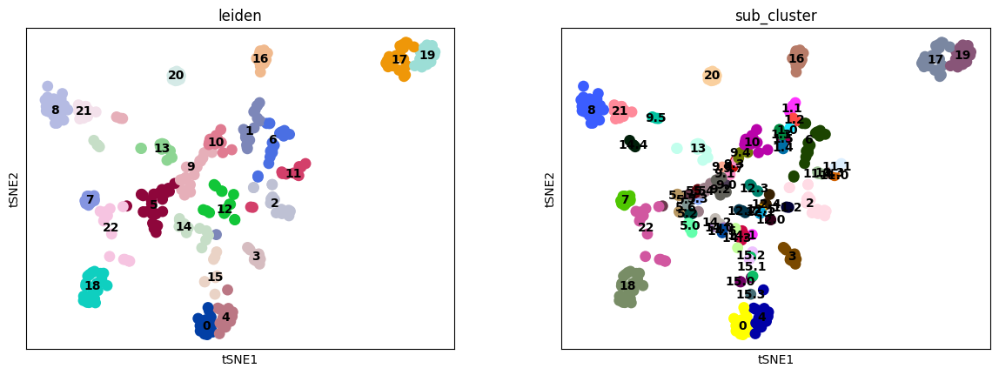

In [20]:
_ = sc.pl.tsne(pattern_adata, color=["leiden", "sub_cluster"], legend_loc="on data")

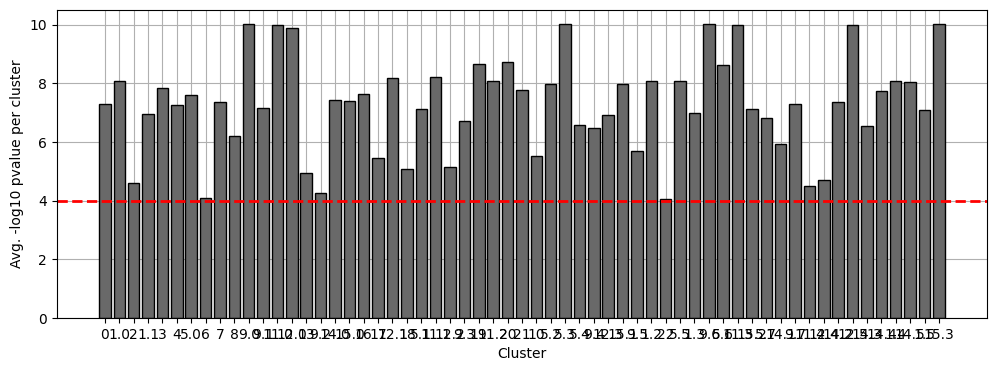

In [21]:
_threshold = 4
_values = [
    pattern_adata[
        pattern_adata.obs.sub_cluster == c, pattern_adata.obs.sub_cluster == c
    ].X.mean()
    for c in pattern_adata.obs.sub_cluster.unique()
]
fig, ax = plt.subplots(figsize=(12, 4))
ax.bar(
    x=np.arange(len(pattern_adata.obs.sub_cluster.unique())),
    height=_values,
    color=["lightgray" if v < _threshold else "dimgray" for v in _values],
    edgecolor="black",
)
_ = ax.set_xticks(
    np.arange(len(pattern_adata.obs.sub_cluster.unique())),
    labels=pattern_adata.obs.sub_cluster.unique(),
)
_ = ax.set_xlabel("Cluster")
_ = ax.set_ylabel("Avg. -log10 pvalue per cluster")
_ = ax.axhline(_threshold, color="red", ls="dashed", lw=2)
ax.grid(True)
ax.set_axisbelow(True)
to_sub_cluster = [
    c for c, v in zip(pattern_adata.obs.sub_cluster.unique(), _values) if v < _threshold
]

## Visualize patterns per cluster

It's always good to visualy inspect which patterns got clusterted together.

Let's do that now.

Cluster: 0


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


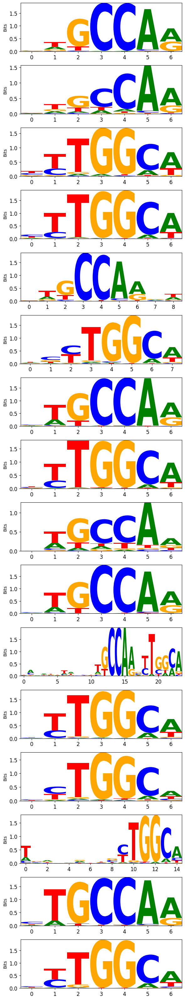

Cluster: 1.0


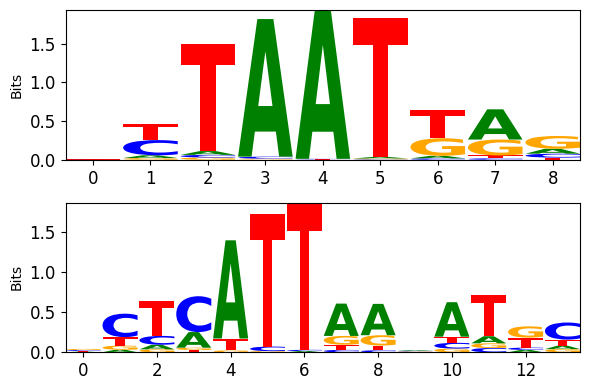

Cluster: 2


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


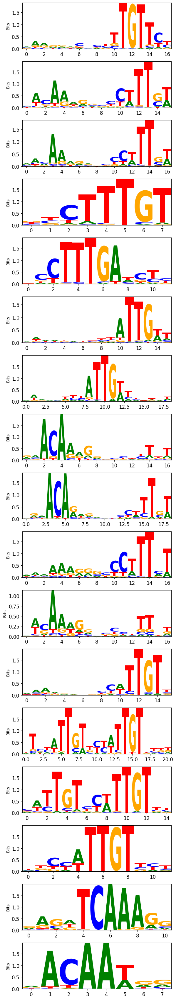

Cluster: 1.1


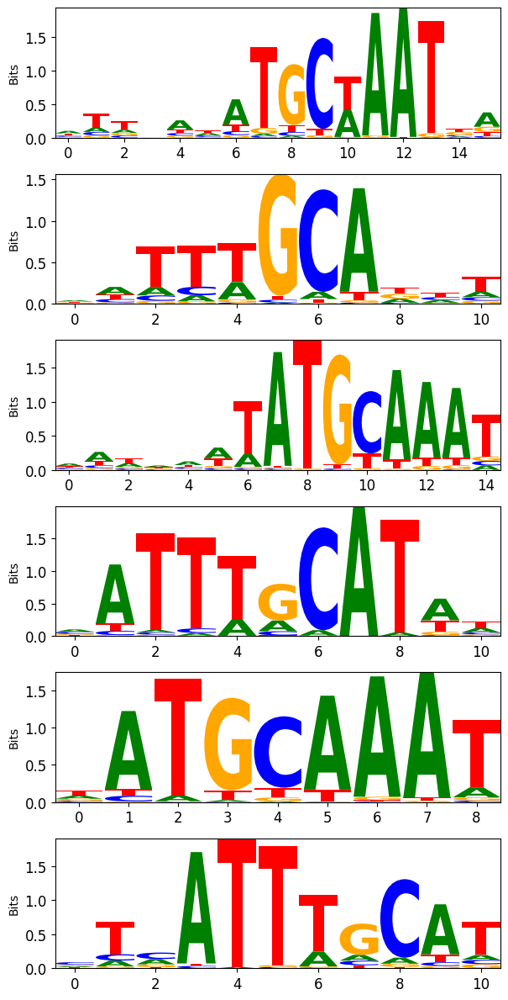

Cluster: 3


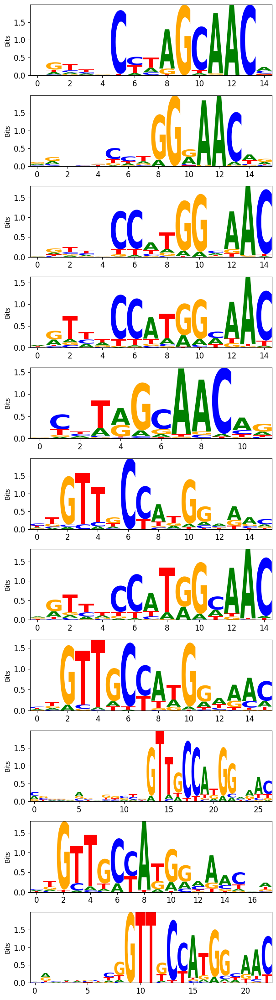

Cluster: 4


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


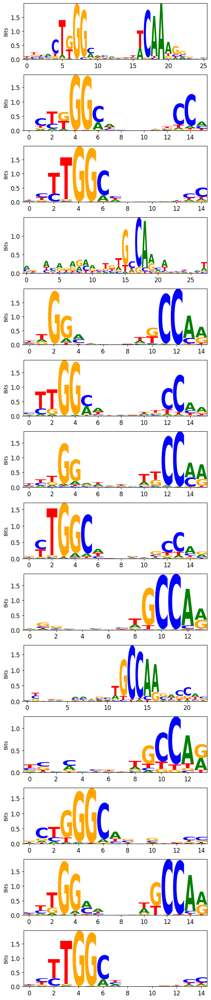

Cluster: 5.0


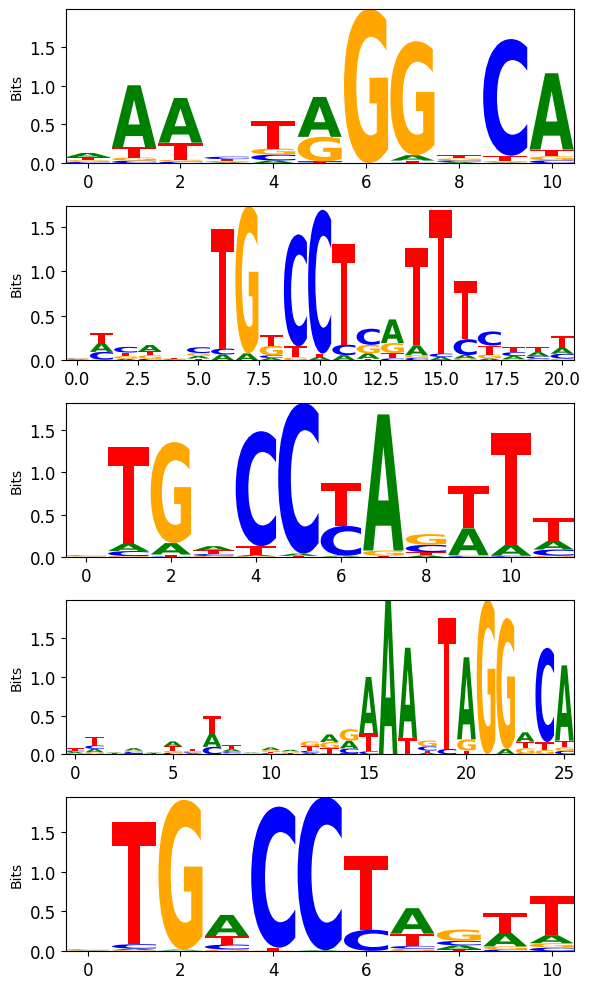

Cluster: 6


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


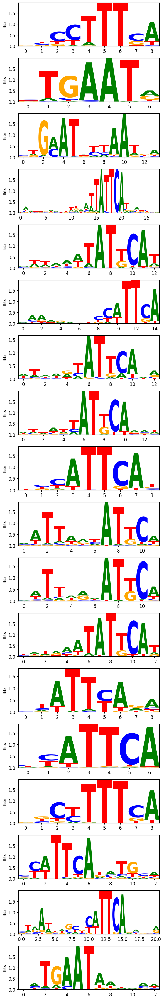

Cluster: 7


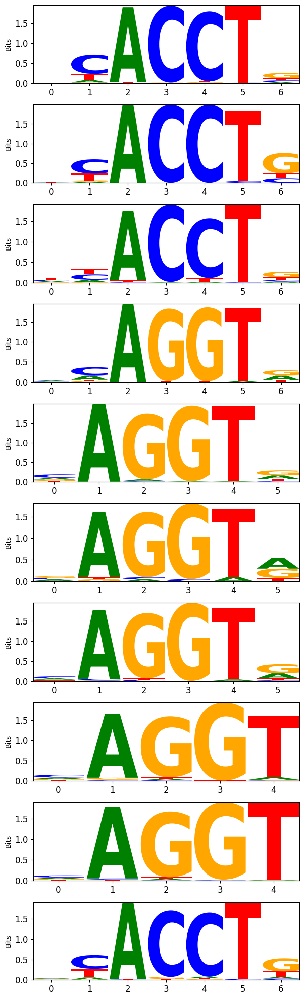

Cluster: 8


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


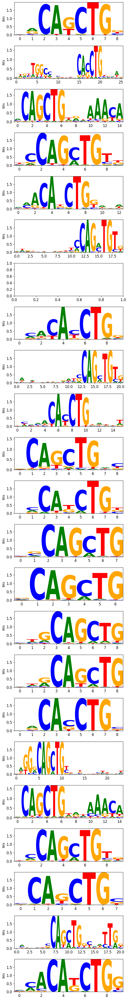

Cluster: 9.0


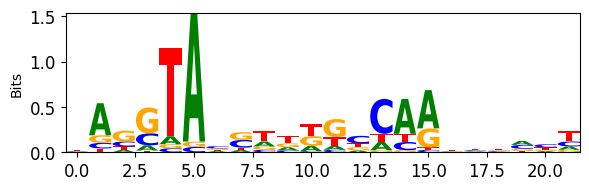

Cluster: 9.1


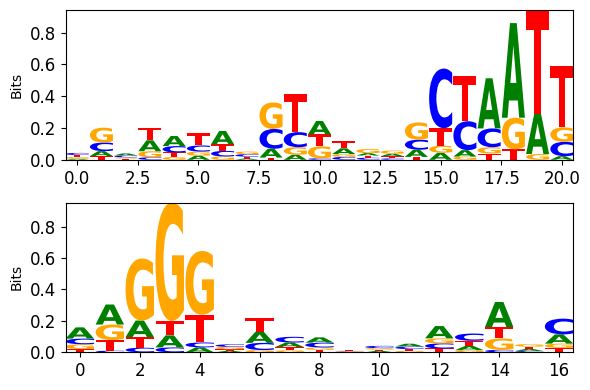

Cluster: 11.0


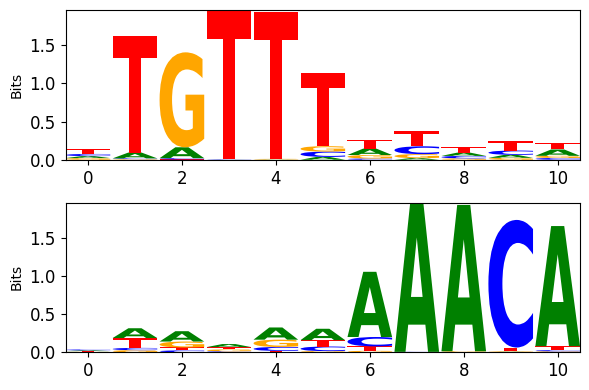

Cluster: 12.0


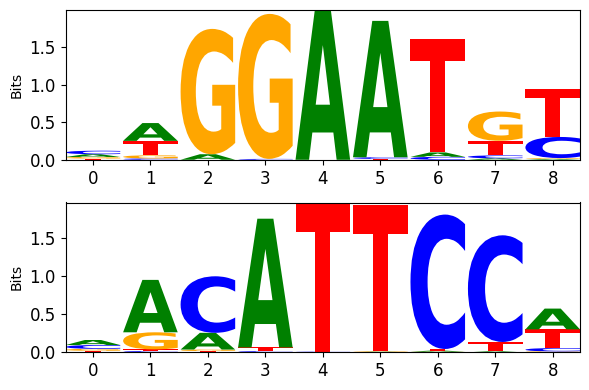

Cluster: 13


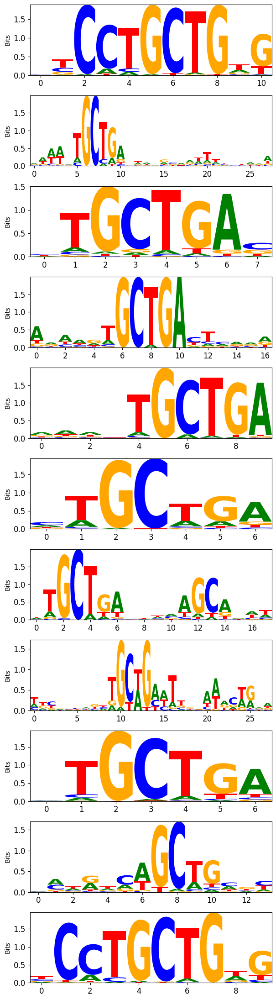

Cluster: 9.2


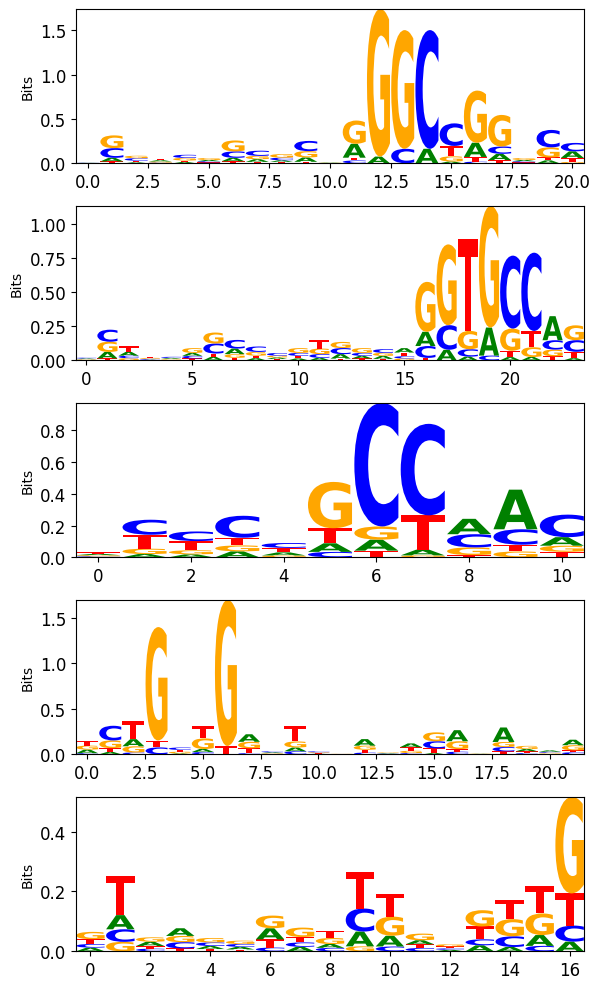

Cluster: 14.0


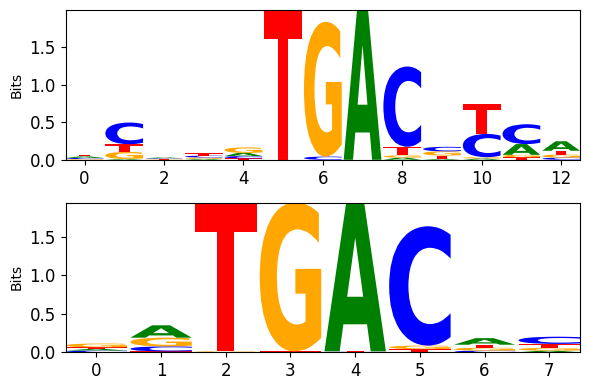

Cluster: 15.0


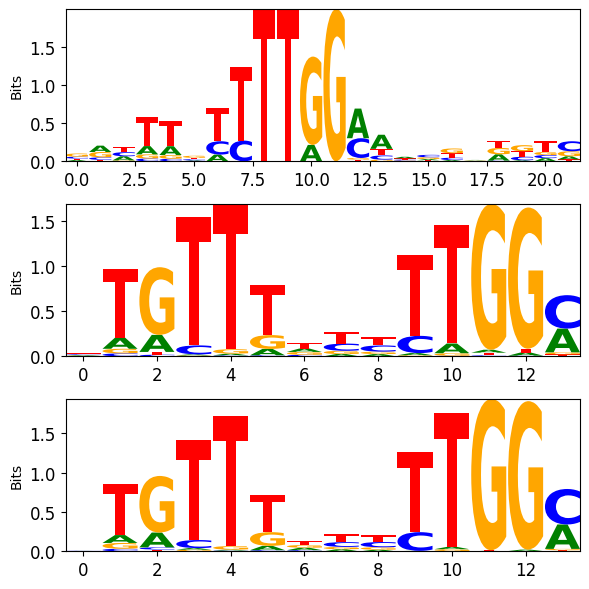

Cluster: 16


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


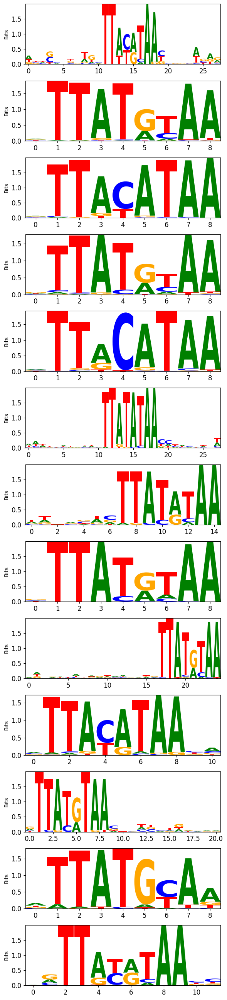

Cluster: 17


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


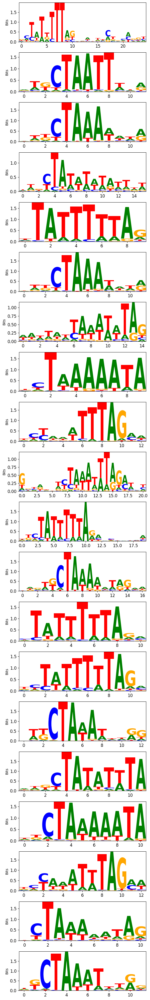

Cluster: 12.1


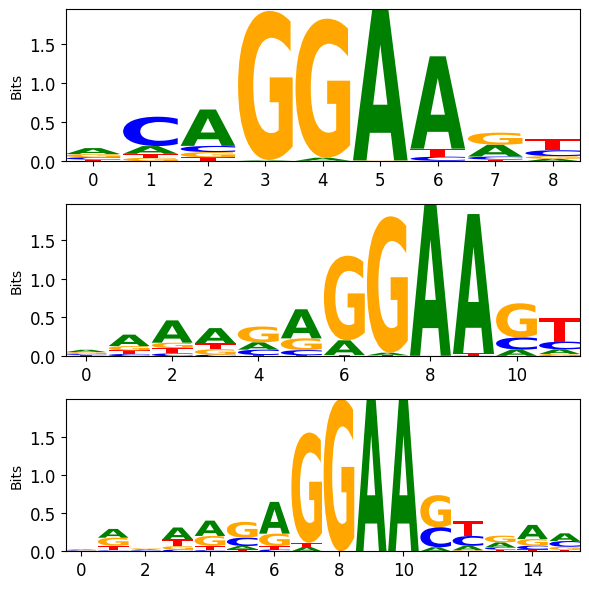

Cluster: 18


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


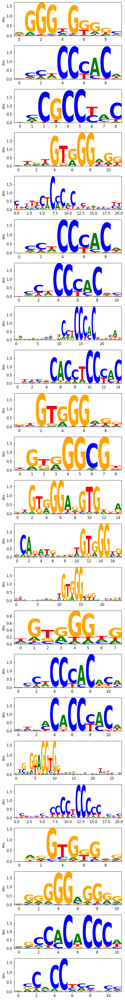

Cluster: 5.1


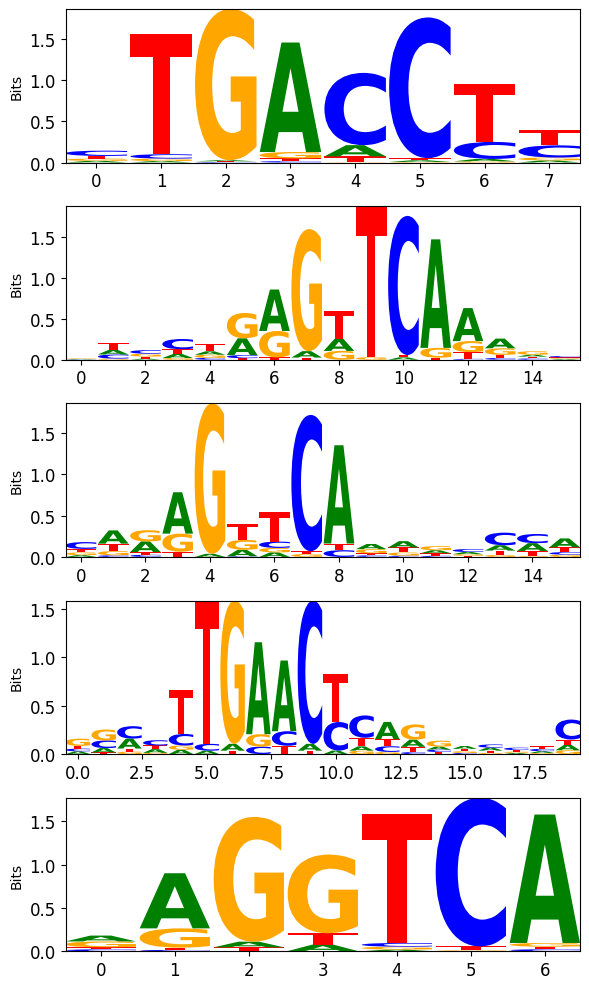

Cluster: 11.1


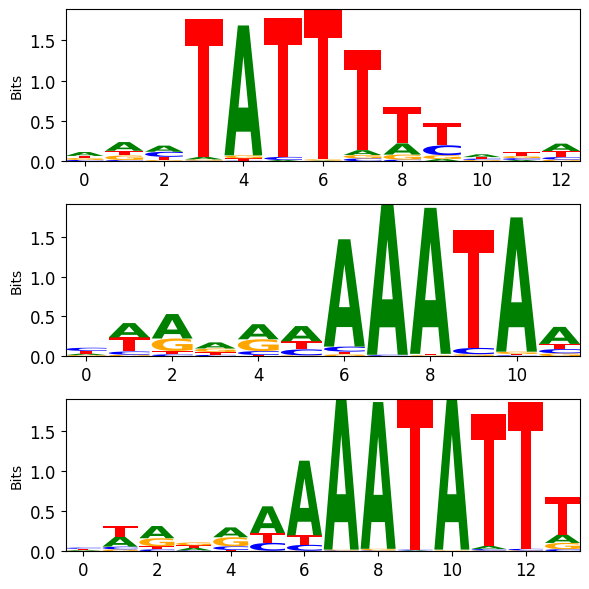

Cluster: 12.2


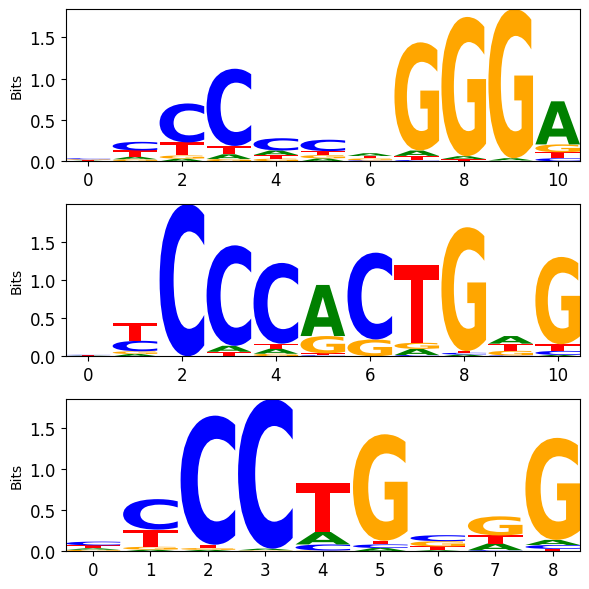

Cluster: 9.3


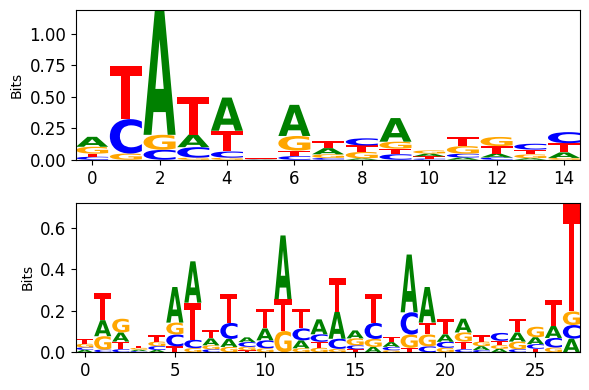

Cluster: 19


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


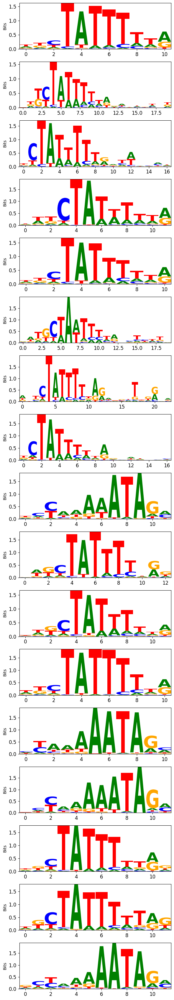

Cluster: 11.2


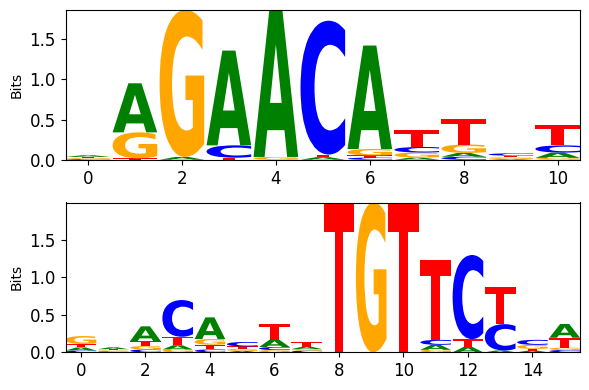

Cluster: 20


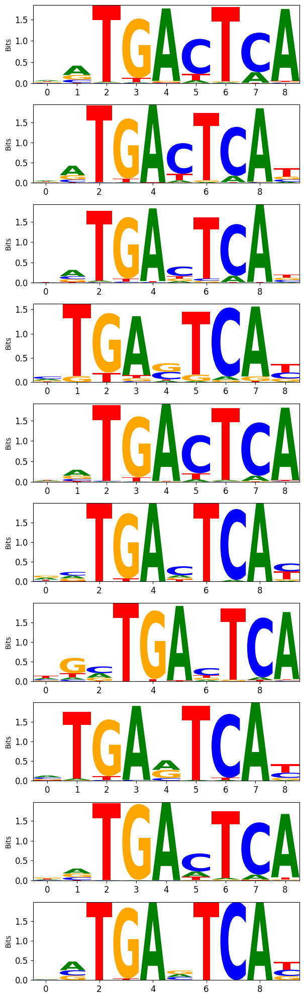

Cluster: 21


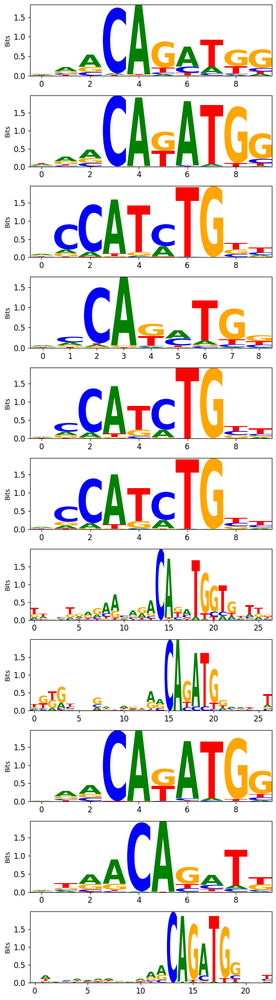

Cluster: 10


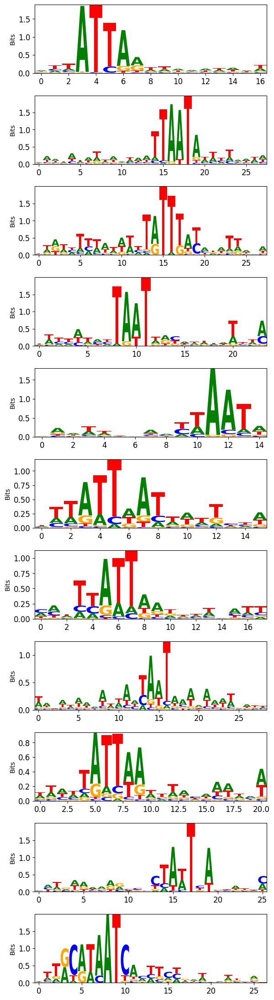

Cluster: 5.2


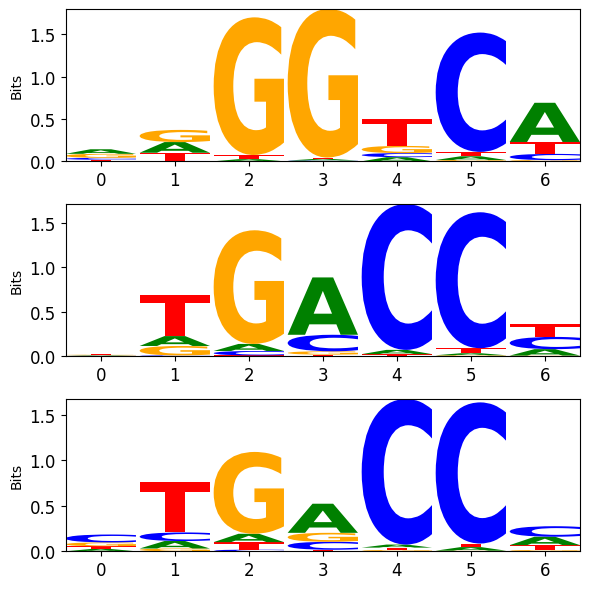

Cluster: 5.3


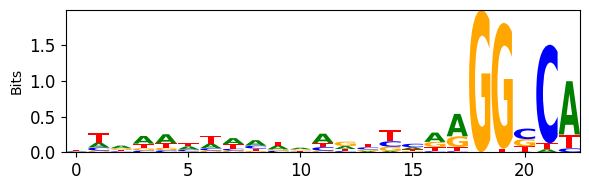

Cluster: 5.4


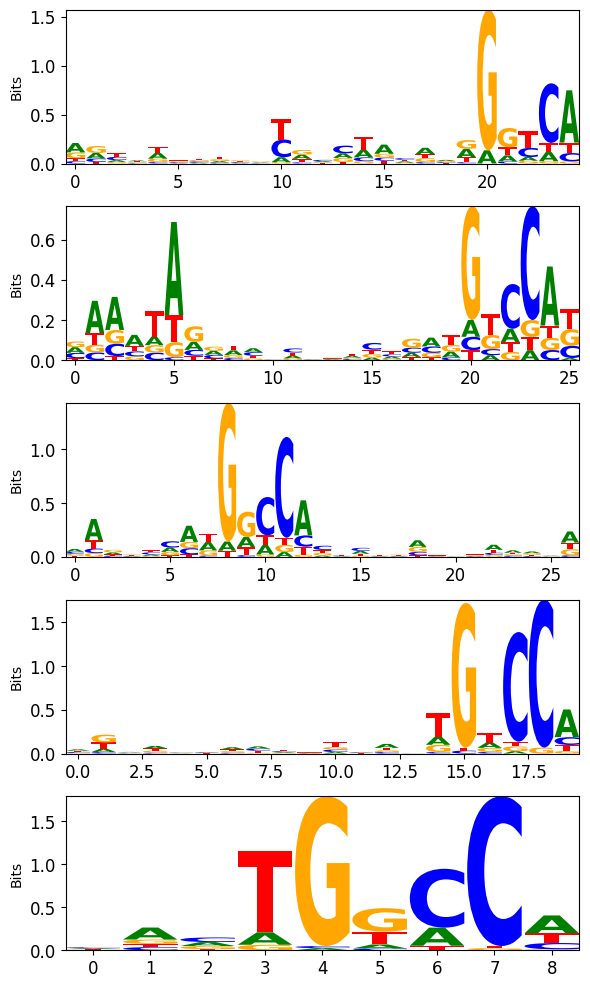

Cluster: 9.4


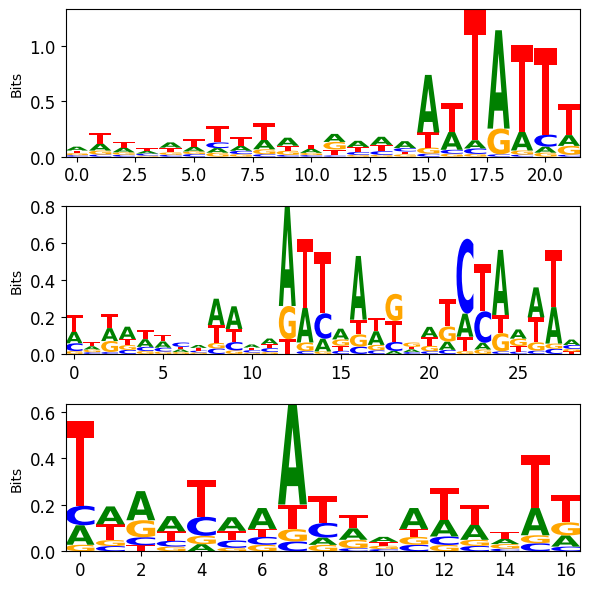

Cluster: 12.3


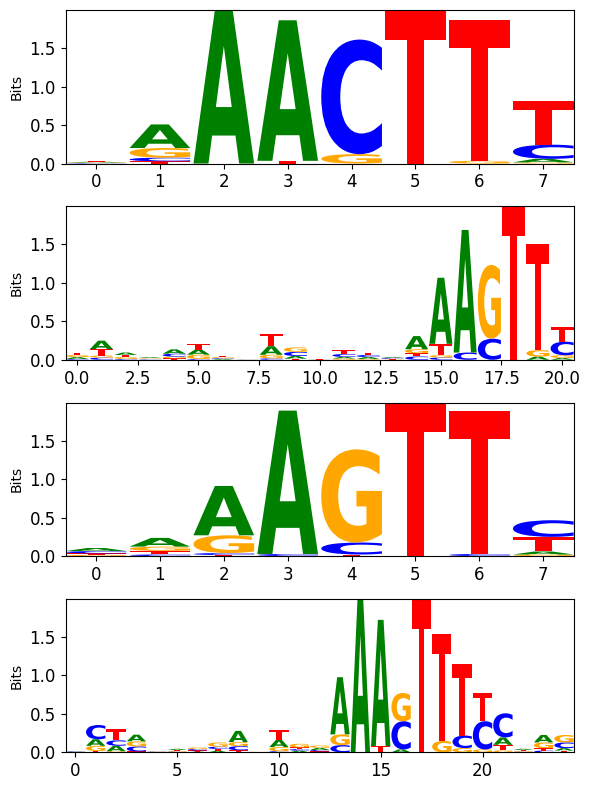

Cluster: 15.1


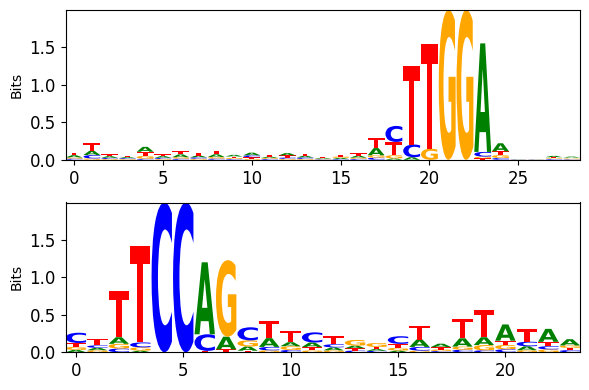

Cluster: 9.5


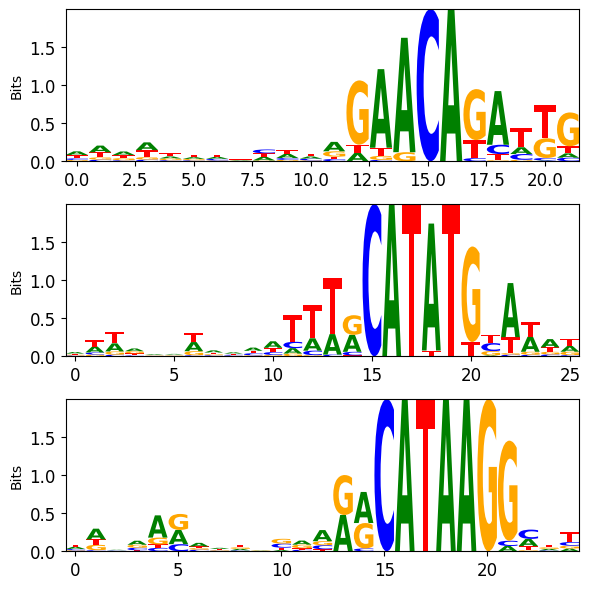

Cluster: 1.2


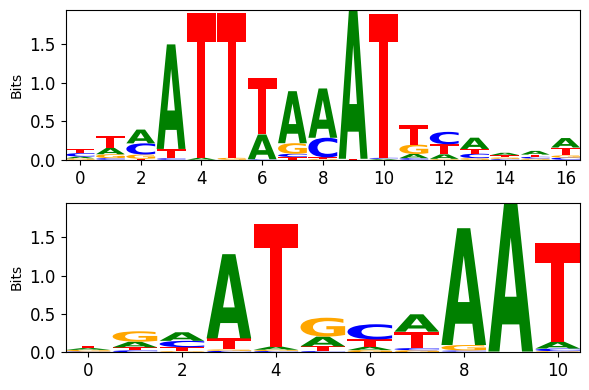

Cluster: 22


/data/groups/vib.ai/stein.aerts/sdewin/PhD/python_modules/CREsted/src/crested/pl/patterns/_modisco_results.py:1147: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


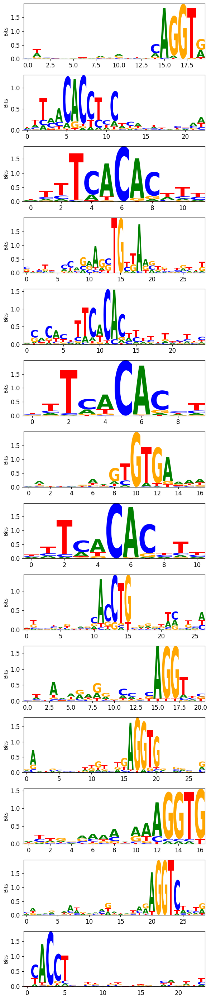

Cluster: 5.5


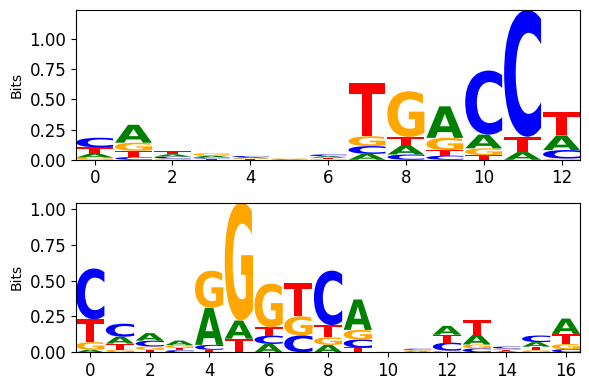

Cluster: 1.3


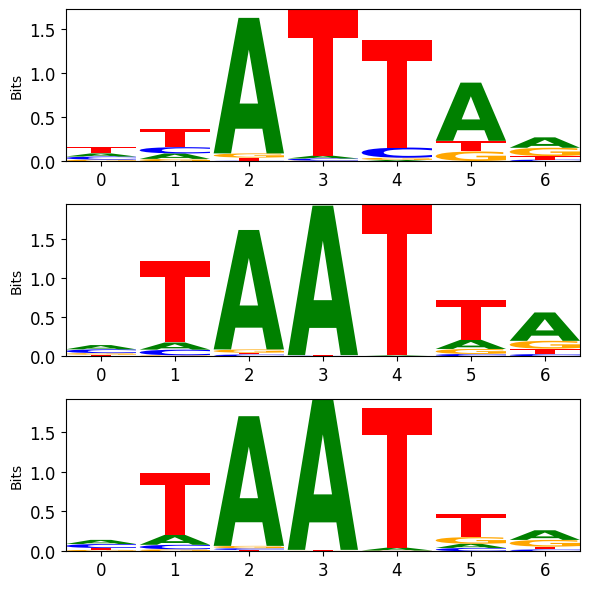

Cluster: 9.6


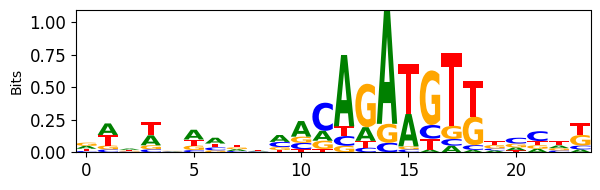

Cluster: 5.6


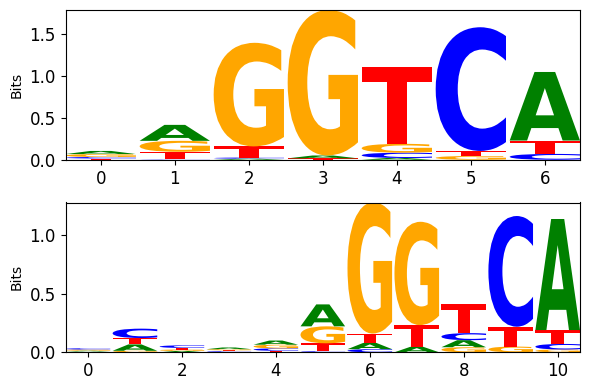

Cluster: 11.3


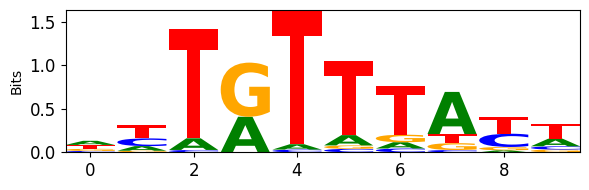

Cluster: 15.2


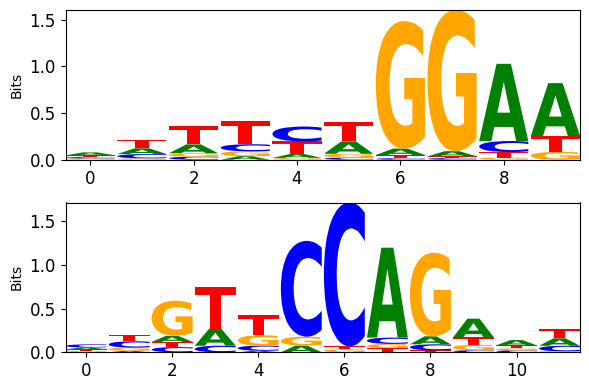

Cluster: 5.7


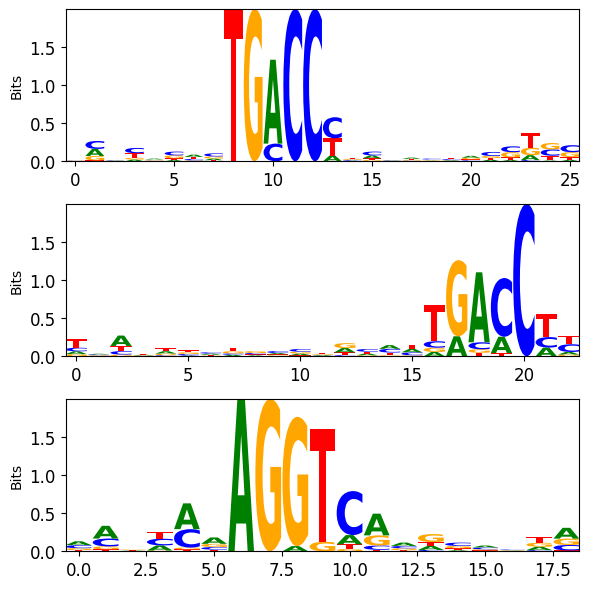

Cluster: 14.1


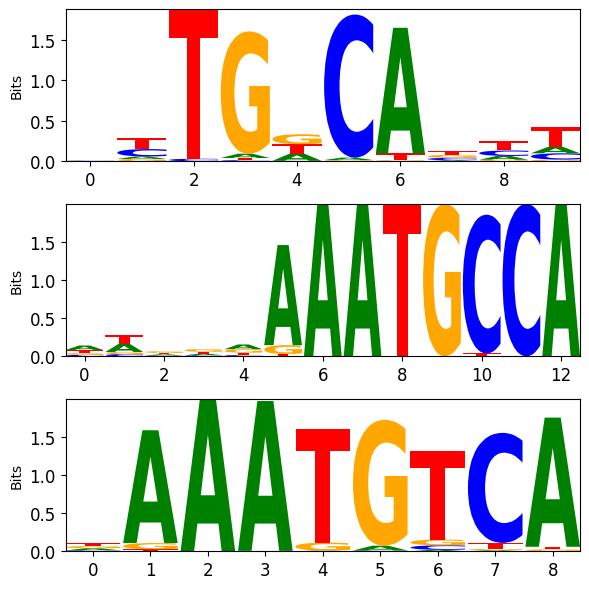

Cluster: 9.7


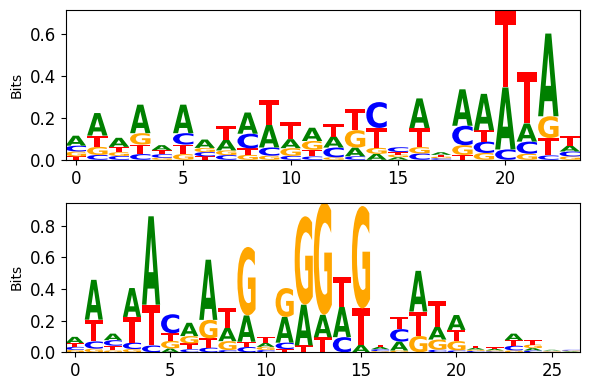

Cluster: 11.4


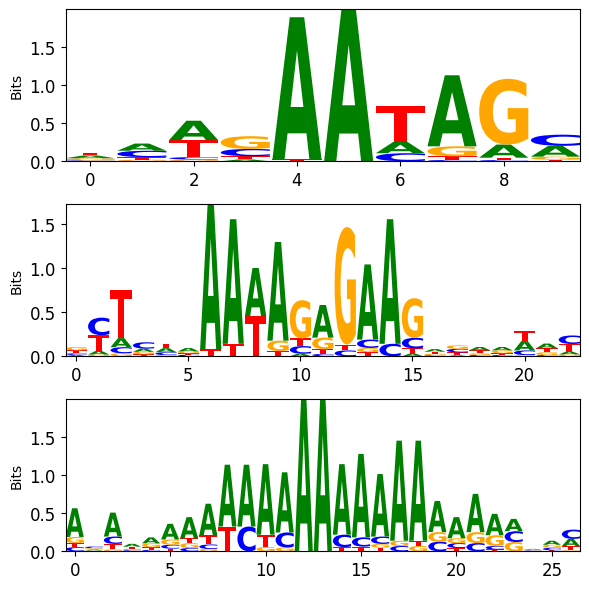

Cluster: 12.4


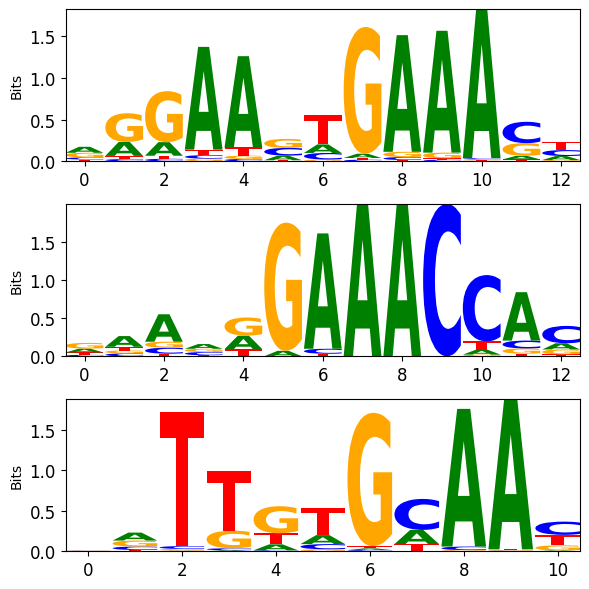

Cluster: 14.2


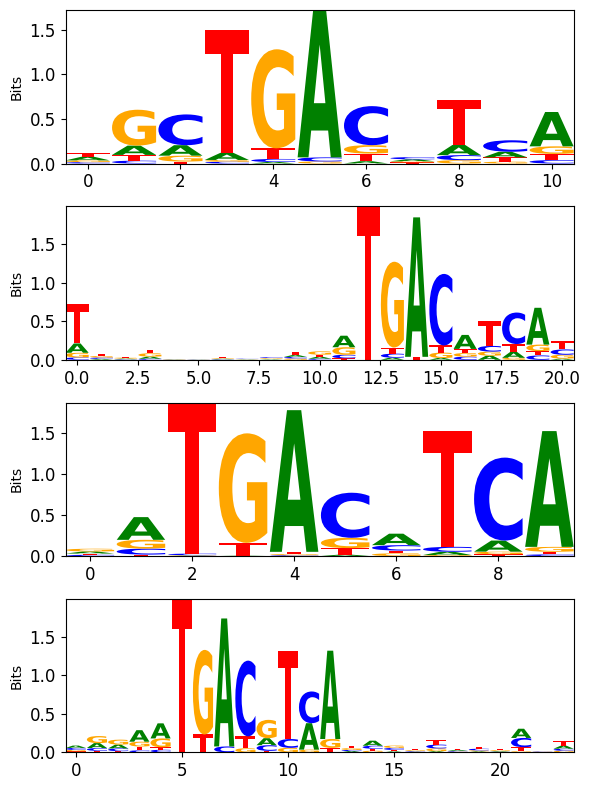

Cluster: 12.5


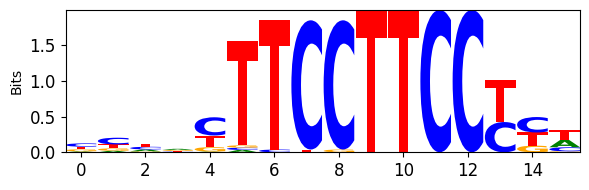

Cluster: 14.3


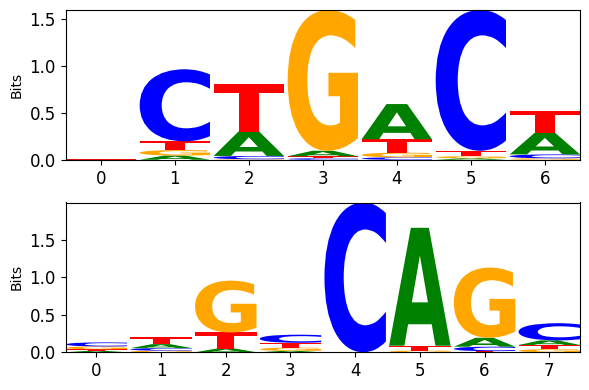

Cluster: 14.4


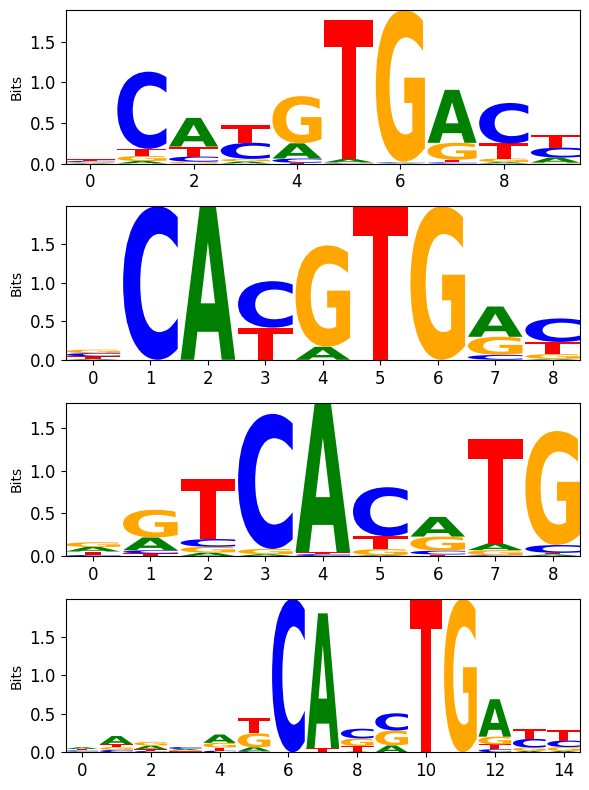

Cluster: 1.4


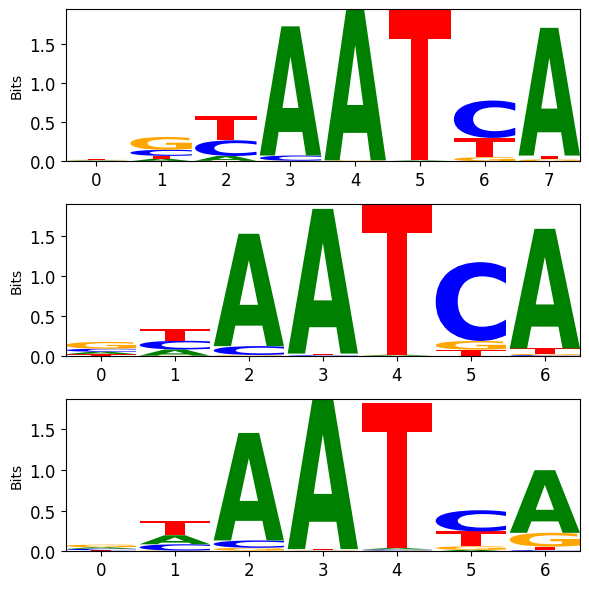

Cluster: 14.5


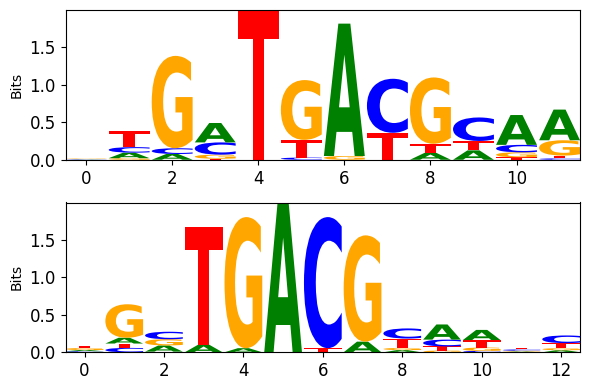

Cluster: 1.5


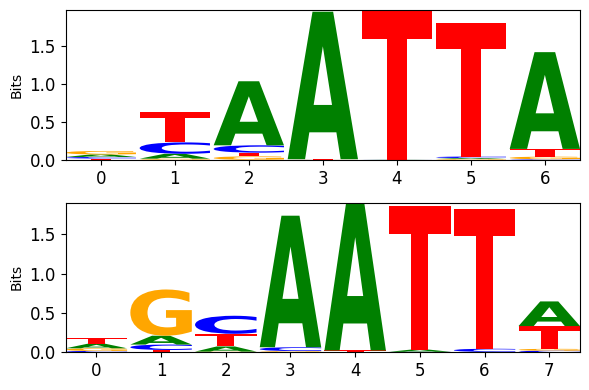

Cluster: 15.3


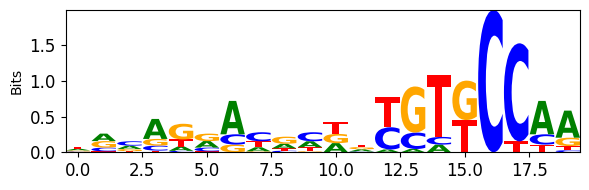

In [22]:
for cluster in pattern_adata.obs.sub_cluster.unique():
    pattern_names_of_cluster = pattern_adata.obs_names[
        pattern_adata.obs.sub_cluster == cluster
    ]
    patterns_of_cluster = [
        p for p, n in zip(patterns, pattern_names) if n in pattern_names_of_cluster
    ]
    print(f"Cluster: {cluster}")
    crested.pl.patterns.plot_pattern(patterns_of_cluster, ic_threshold)

## Merge similar patterns

Next, for each cluster we will merge the patterns into a single merged pattern per cluster.

This function will also align all instances of the patterns, which is useful for downstream analysis (like visualizing the code table below).

In [23]:
combined_pattern_names, combined_patterns = [], []
for cluster in pattern_adata.obs.sub_cluster.unique():
    print(cluster)
    pattern_names_of_cluster = pattern_adata.obs_names[
        pattern_adata.obs.sub_cluster == cluster
    ]
    patterns_of_cluster = [
        p for p, n in zip(patterns, pattern_names) if n in pattern_names_of_cluster
    ]
    combined_pattern_names.append(f"patterns_cluster_{cluster}")
    combined_patterns.append(
        crested.tl.modisco.combine_patterns(
            patterns=patterns_of_cluster, ic_threshold=ic_threshold
        )
    )

0
1.0
2
1.1
3
4
5.0
6
7
8
9.0
9.1
11.0
12.0
13
9.2
14.0
15.0
16
17
12.1
18
5.1
11.1
12.2
9.3
19
11.2
20
21
10
5.2
5.3
5.4
9.4
12.3
15.1
9.5
1.2
22
5.5
1.3
9.6
5.6
11.3
15.2
5.7
14.1
9.7
11.4
12.4
14.2
12.5
14.3
14.4
1.4
14.5
1.5
15.3


## Visualize merged patterns

Let's inspect how these merged patterns look like.

Here, it's important to assess wether the alignment worked well.
For most clusters the patterns seem to be aligned correctly, however something weird is goign on with patterns of cluster 8.

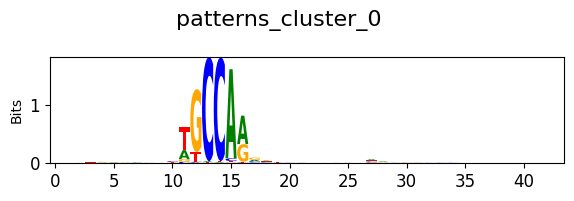

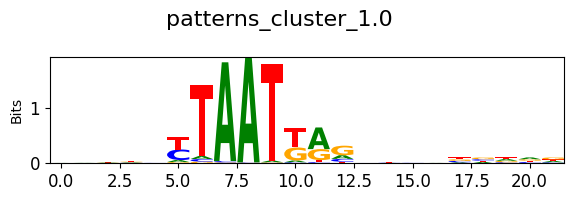

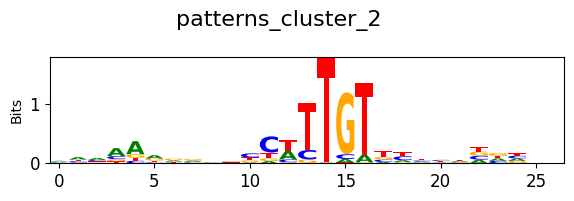

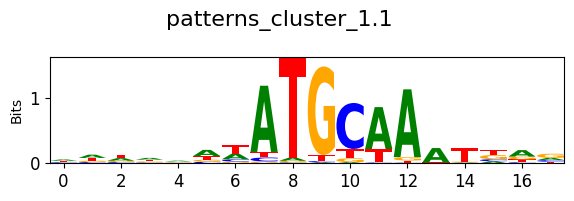

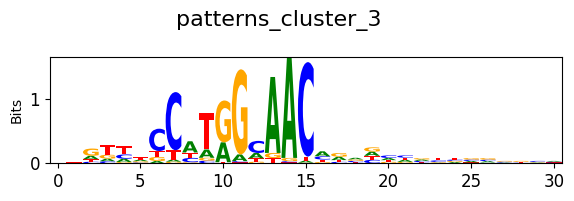

...

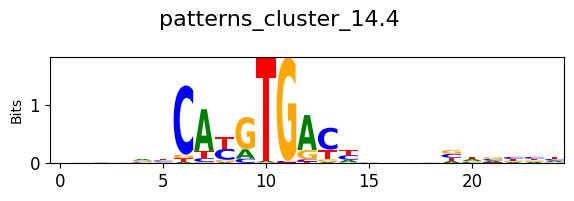

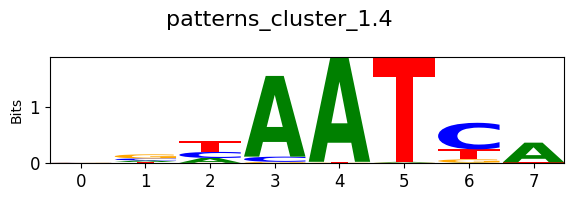

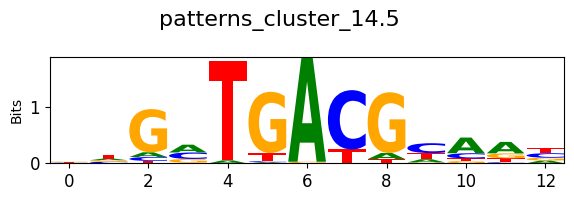

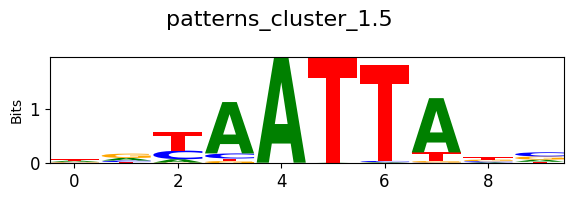

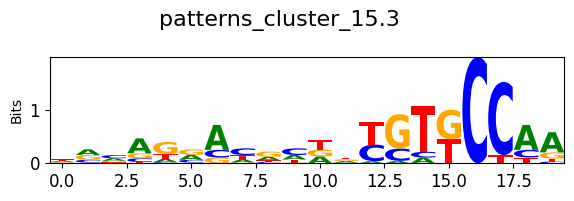

In [24]:
for n, pattern in zip(combined_pattern_names, combined_patterns):
    crested.pl.patterns.plot_pattern(pattern, scale_by_ic=True, title=n)

## Manual intervention for cluster 8

Let's manually define sub clusters for patterns of cluster 8.

Some patterns contain a single EBOX motif, others contain an EBOX and a FOX motif.

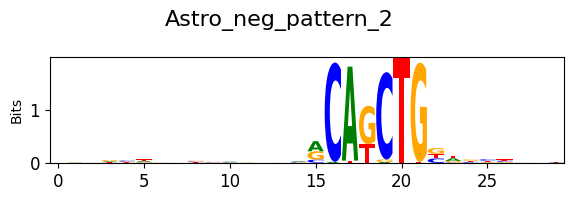

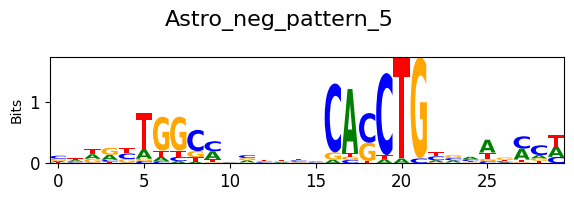

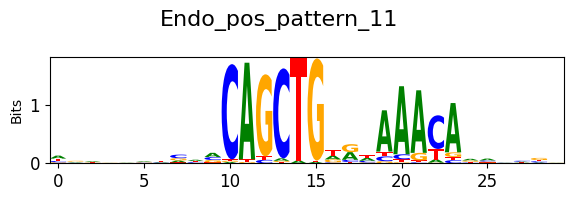

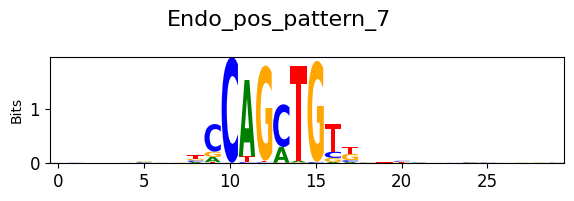

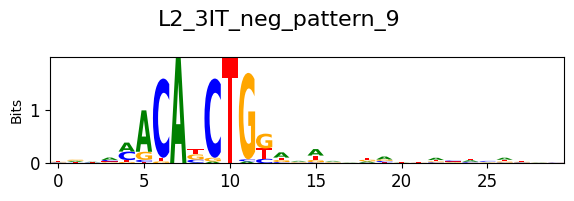

...

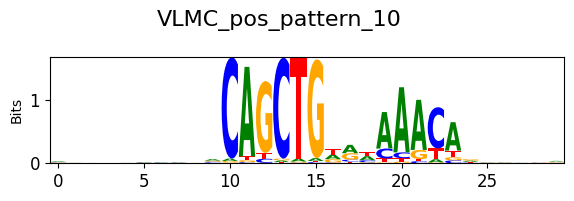

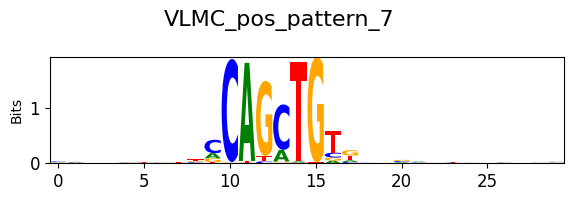

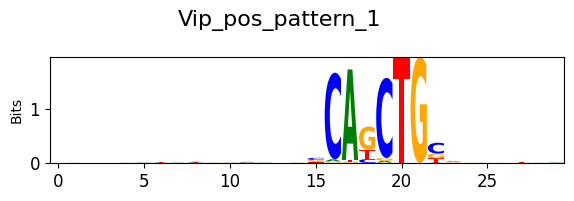

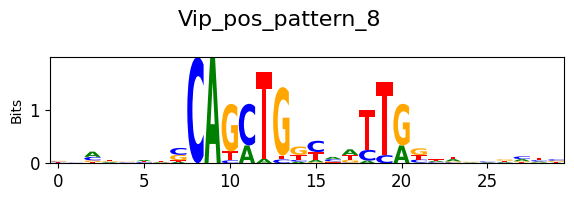

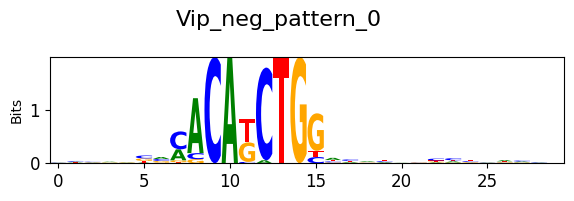

In [25]:
cluster = "8"
pattern_names_of_cluster = pattern_adata.obs_names[
    pattern_adata.obs.sub_cluster == cluster
]
patterns_of_cluster = [
    p for p, n in zip(patterns, pattern_names) if n in pattern_names_of_cluster
]
for p, n in zip(patterns_of_cluster, pattern_names_of_cluster):
    crested.pl.patterns.plot_pattern(p, scale_by_ic=True, title=n)

In [26]:
pattern_name_to_sub = {
    "Astro_neg_pattern_2": "8.0",
    "Astro_neg_pattern_5": "8.1",
    "Endo_pos_pattern_11": "8.2",
    "Endo_pos_pattern_7": "8.0",
    "L2_3IT_neg_pattern_9": "8.0",
    "L5IT_neg_pattern_13": "8.0",
    "L6CT_pos_pattern_7": "8.0",
    "L6CT_neg_pattern_0": "8.0",
    "L6IT_neg_pattern_12": "8.0",
    "L6b_neg_pattern_2": "8.0",
    "Micro_PVM_pos_pattern_10": "8.0",
    "Micro_PVM_neg_pattern_1": "8.0",
    "OPC_pos_pattern_4": "8.0",
    "Oligo_pos_pattern_2": "8.0",
    "Pvalb_pos_pattern_2": "8.0",
    "Sst_pos_pattern_0": "8.0",
    "SstChodl_pos_pattern_0": "8.0",
    "SstChodl_pos_pattern_12": "8.0",
    "VLMC_pos_pattern_10": "8.2",
    "VLMC_pos_pattern_7": "8.0",
    "Vip_pos_pattern_1": "8.0",
    "Vip_pos_pattern_8": "8.1",
    "Vip_neg_pattern_0": "8.0",
}

In [27]:
pattern_adata.obs["sub_cluster"] = pattern_adata.obs["sub_cluster"].astype(str)
pattern_adata.obs["sub_cluster"]

Astro_pos_pattern_0       0
Astro_pos_pattern_1     1.0
Astro_pos_pattern_10      2
Astro_pos_pattern_11      2
Astro_pos_pattern_12    1.1
                       ... 
Vip_pos_pattern_5        19
Vip_pos_pattern_6         6
Vip_pos_pattern_7        20
Vip_pos_pattern_8         8
Vip_neg_pattern_0         8
Name: sub_cluster, Length: 354, dtype: object

In [28]:
for k in pattern_name_to_sub:
    pattern_adata.obs.loc[k, "sub_cluster"] = pattern_name_to_sub[k]

Let's redefine the combined patterns.

In [29]:
combined_pattern_names, combined_patterns = [], []
for cluster in pattern_adata.obs.sub_cluster.unique():
    print(cluster)
    pattern_names_of_cluster = pattern_adata.obs_names[
        pattern_adata.obs.sub_cluster == cluster
    ]
    patterns_of_cluster = [
        p for p, n in zip(patterns, pattern_names) if n in pattern_names_of_cluster
    ]
    combined_pattern_names.append(f"patterns_cluster_{cluster}")
    combined_patterns.append(
        crested.tl.modisco.combine_patterns(
            patterns=patterns_of_cluster, ic_threshold=ic_threshold
        )
    )

0
1.0
2
1.1
3
4
5.0
6
7
8.0
9.0
9.1
8.1
11.0
12.0
8.2
13
9.2
14.0
15.0
16
17
12.1
18
5.1
11.1
12.2
9.3
19
11.2
20
21
10
5.2
5.3
5.4
9.4
12.3
15.1
9.5
1.2
22
5.5
1.3
9.6
5.6
11.3
15.2
5.7
14.1
9.7
11.4
12.4
14.2
12.5
14.3
14.4
1.4
14.5
1.5
15.3


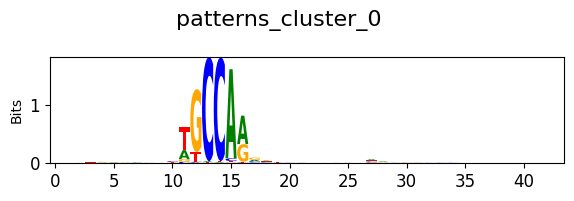

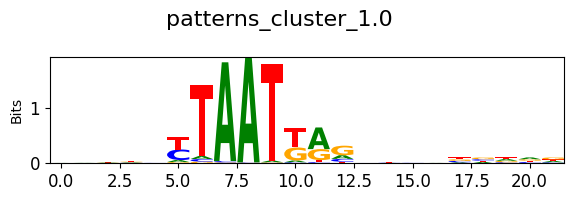

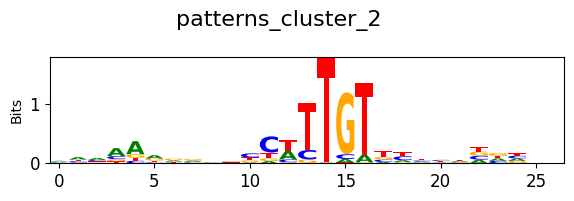

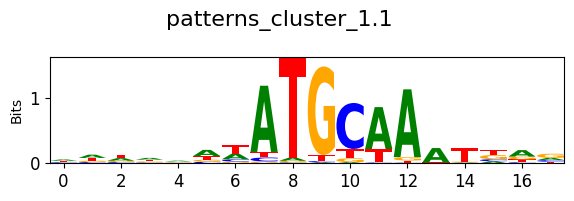

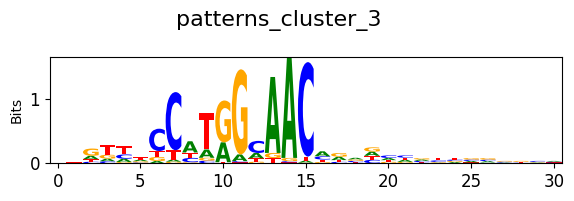

...

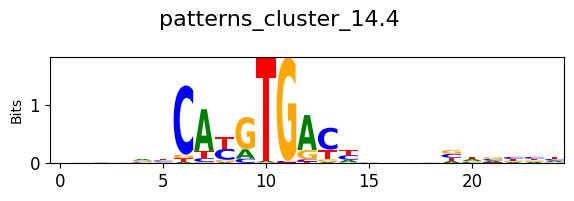

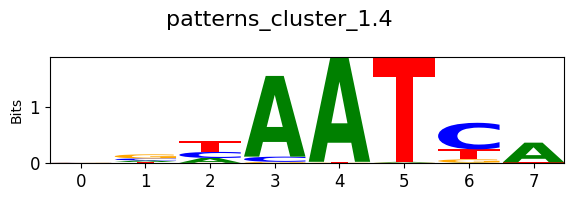

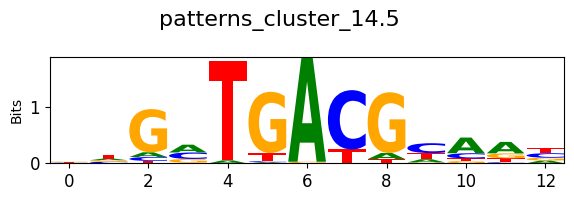

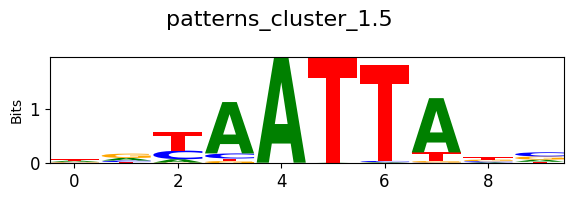

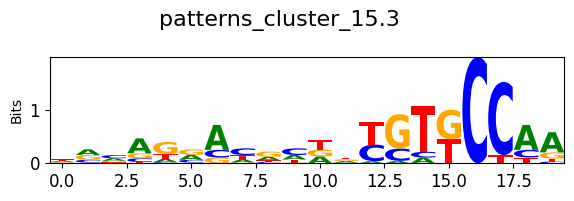

In [30]:
for n, pattern in zip(combined_pattern_names, combined_patterns):
    crested.pl.patterns.plot_pattern(pattern, scale_by_ic=True, title=n)

## Calculate gradients for all classess and selected combined patterns

Let's select some nice looking motifs.

For all these motifs we want to assess the importance of that motif for all classes (cell types) of the model.
For this purpose, we have to calculate the model's gradient for each instance of all selected paterns.

In [31]:
clusters_to_show = [
    0,
    1.0,
    2,
    1.1,
    3,
    4,
    6,
    7,
    8.1,
    11.0,
    12.0,
    8.2,
    15.0,
    17,
    12.1,
    18,
    5.1,
    11.1,
    19,
    20,
    21,
    1.3,
    5.6,
    11.3,
    5.7,
    14.2,
    12.5,
    14.3,
    1.4,
    1.5,
]

First we get the one hot encoded sequences for all patterns.

Given that some instances of patterns can be present in the same genomic region this array will contain many duplicates.
This is not very computationally efficient, so we will deduplicate this array but keep an index mapping values to the original array (`inverse_index`).

In [32]:
oh = []
metadata = []
for cluster in clusters_to_show:
    for seqlet in combined_patterns[
        combined_pattern_names.index(f"patterns_cluster_{cluster}")
    ].seqlets:
        oh.append(seqlet.region_one_hot)
        metadata.append(
            (f"patterns_cluster_{cluster}", seqlet.start, seqlet.end, seqlet.is_revcomp)
        )
oh = np.array(oh)

In [33]:
oh, inverse_index = np.unique(oh, axis=0, return_inverse=True)

Finally, we calculate the explanation for each class and all sequences.

We will use the function `saliency_map`, this mostly because it is relatively fast. In general the explanations you get from this function are noisy.
However, given that we are averaging the signal across ~1000 instances this noise will in general be averaged out.

This function takes ~1 minute per model class for ~45k unique regions on a GPU node.


In [ ]:
from crested.tl import _explainer

input_size = model.input.shape[1]
left_pad = (input_size - oh.shape[1]) // 2
right_pad = input_size - oh.shape[1] - left_pad
oh = np.pad(oh, ((0, 0), (left_pad, right_pad), (0, 0)))


attrs = np.zeros((model.output.shape[1], oh.shape[0], oh.shape[1], 4))
print(attrs.shape)
for i in range(model.output.shape[1]):
    print(i)
    attrs[i] = _explainer.saliency_map(X=oh, model=model, class_index=i)

(19, 45144, 2114, 4)
0


I0000 00:00:1747382993.784211 3406255 cuda_dnn.cc:529] Loaded cuDNN version 90300


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


## Regenerate contribution score of each pattern for each class

Now that we have attributions score for each pattern and cell type we can calculate the importance of each pattern for all cell types.

For this, we first create a dataframe containing alignment information of all patterns.

In [36]:
import pandas as pd

metadata = pd.DataFrame(metadata, columns=["pattern_name", "start", "end", "rc"])

In [37]:
metadata

,pattern_name,start,end,rc
0,patterns_cluster_0,517,544,False
1,patterns_cluster_0,449,476,False
2,patterns_cluster_0,397,424,False
3,patterns_cluster_0,509,536,False
4,patterns_cluster_0,447,474,False
...,...,...,...,...
94855,patterns_cluster_1.5,416,426,False
94856,patterns_cluster_1.5,456,466,False
94857,patterns_cluster_1.5,415,425,False
94858,patterns_cluster_1.5,49,59,False


The inverse index together witht his dataframe is used to get importance of each pattern for all classes.

In [38]:
pat_per_cluster_and_class = {}
for cluster in clusters_to_show:
    print(cluster)
    pattern_name = f"patterns_cluster_{cluster}"
    expl_cl = (
        attrs[:, inverse_index[metadata.query("pattern_name == @pattern_name").index]]
        * oh[inverse_index[metadata.query("pattern_name == @pattern_name").index]]
    )[:, :, left_pad : input_size - right_pad]
    ic_start, ic_end = combined_patterns[
        combined_pattern_names.index(pattern_name)
    ].ic_trim(ic_threshold)
    inst_cl = np.zeros((expl_cl.shape[0], expl_cl.shape[1], ic_end - ic_start, 4))
    for i, (_, (_, start, _, rc)) in enumerate(
        metadata.query("pattern_name == @pattern_name").iterrows()
    ):
        end = start + ic_end
        start = start + ic_start
        inst_cl[:, i, 0 : end - start] = (
            expl_cl[:, i, start:end][:, ::-1, ::-1] if rc else expl_cl[:, i, start:end]
        )
    pat_per_cluster_and_class[cluster] = inst_cl.mean(1)

0
1.0
2
1.1
3
4
6
7
8.1
11.0
12.0
8.2
15.0
17
12.1
18
5.1
11.1
19
20
21
1.3
5.6
11.3
5.7
14.2
12.5
14.3
1.4
1.5


## Select patterns per cell type based on contribution score

Let's visualze the importance of all patterns for non-neuronal cell types.

In [39]:
cell_types_to_show = ["Micro_PVM", "Astro", "OPC", "Oligo", "Endo", "VLMC"]
classes_to_show = [np.where(adata.obs_names == c)[0][0] for c in cell_types_to_show]

In [40]:
score_per_class = np.array(
    [
        pat_per_cluster_and_class[c][classes_to_show].sum(1).sum(1)
        for c in clusters_to_show
    ]
)

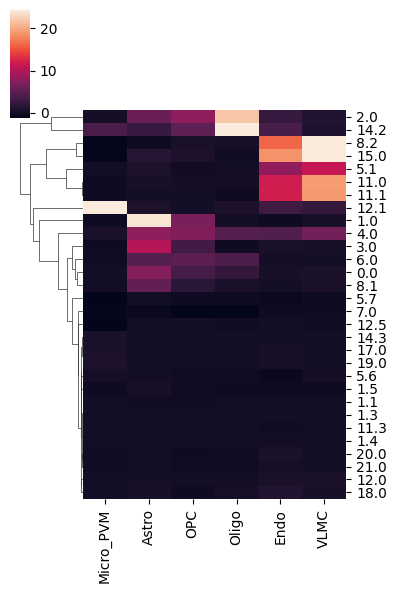

In [41]:
import seaborn as sns

sns.clustermap(
    np.array(
        [
            pat_per_cluster_and_class[c][classes_to_show].sum(1).sum(1)
            for c in clusters_to_show
        ]
    ),
    xticklabels=cell_types_to_show,
    yticklabels=clusters_to_show,
    robust=True,
    figsize=(4, 6),
    col_cluster=False,
)

## Plot code table

Let's select patterns that are important for these cell types and generate a code table.

The code table visualizes the importance score for each pattern and each cell type at nucleotide resolution.

In [42]:
clusters_for_code_table = [
    12.1,
    1.0,
    4.0,
    3.0,
    6.0,
    0.0,
    8.1,
    2,
    14.2,
    8.2,
    15.0,
    5.1,
    11.0,
    11.1,
]

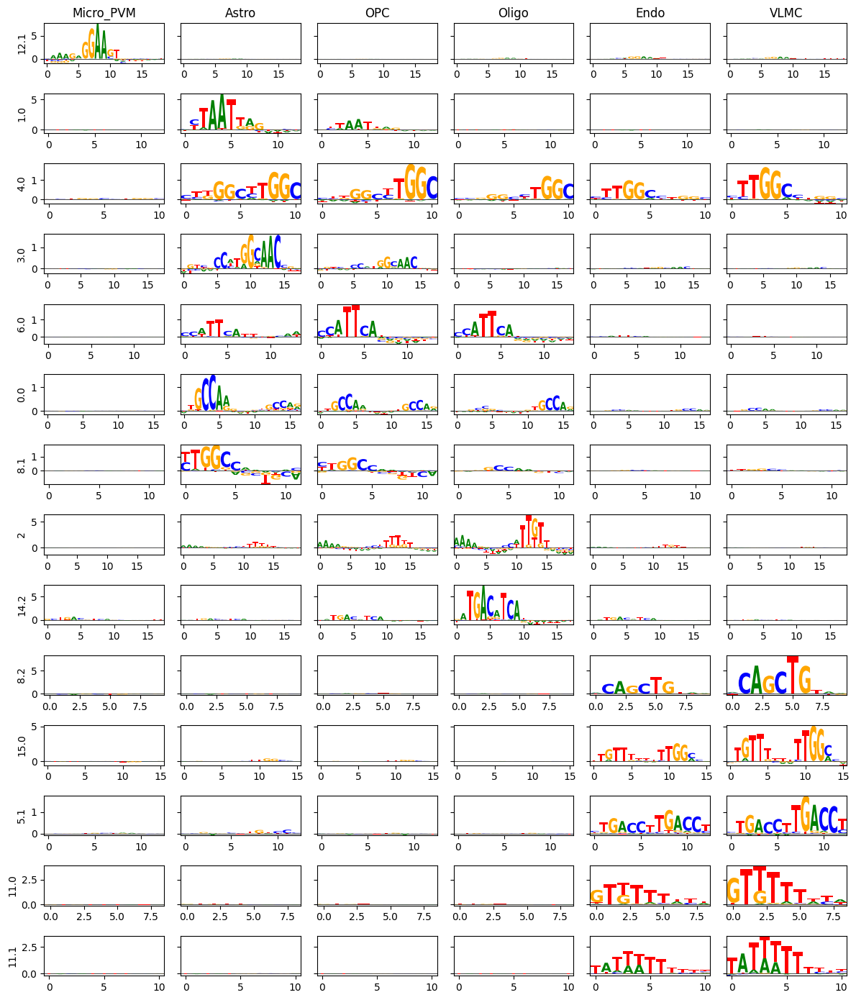

In [44]:
from crested.pl.patterns._utils import _plot_attribution_map

fig, axs = plt.subplots(
    ncols=len(cell_types_to_show),
    nrows=len(clusters_for_code_table),
    sharey="row",
    figsize=(len(cell_types_to_show) * 2, len(clusters_for_code_table)),
)
for i, cluster in enumerate(clusters_for_code_table):
    for j, cell_type in enumerate(cell_types_to_show):
        class_idx = classes_to_show[j]
        _ = _plot_attribution_map(
            pat_per_cluster_and_class[cluster][class_idx], ax=axs[i, j]
        )
        if i == 0:
            axs[i, j].set_title(cell_type)
        if j == 0:
            axs[i, j].set_ylabel(cluster)
fig.tight_layout()
plt.show(fig)

## Visualize individual instances

Let's visualize individual instances of the SPI motif (`GGAA`), in microglia (`Micro_PVM`) and endothelial cells (`Endo`)

In [59]:
cluster = "12.1"
print(cluster)
pattern_name = f"patterns_cluster_{cluster}"
expl_cl = (
    attrs[:, inverse_index[metadata.query("pattern_name == @pattern_name").index]]
    * oh[inverse_index[metadata.query("pattern_name == @pattern_name").index]]
)[:, :, left_pad : input_size - right_pad]
oh_cl = (oh[inverse_index[metadata.query("pattern_name == @pattern_name").index]])[
    :, left_pad : input_size - right_pad
]
ic_start, ic_end = combined_patterns[
    combined_pattern_names.index(pattern_name)
].ic_trim(ic_threshold)
inst_cl = np.zeros((expl_cl.shape[0], expl_cl.shape[1], ic_end - ic_start, 4))
oh_inst_cl = np.zeros((expl_cl.shape[1], ic_end - ic_start, 4))
for i, (_, (_, start, _, rc)) in enumerate(
    metadata.query("pattern_name == @pattern_name").iterrows()
):
    end = start + ic_end
    start = start + ic_start
    inst_cl[:, i, 0 : end - start] = (
        expl_cl[:, i, start:end][:, ::-1, ::-1] if rc else expl_cl[:, i, start:end]
    )
    oh_inst_cl[i, 0 : end - start] = (
        oh_cl[i, start:end][::-1, ::-1] if rc else oh_cl[i, start:end]
    )

12.1


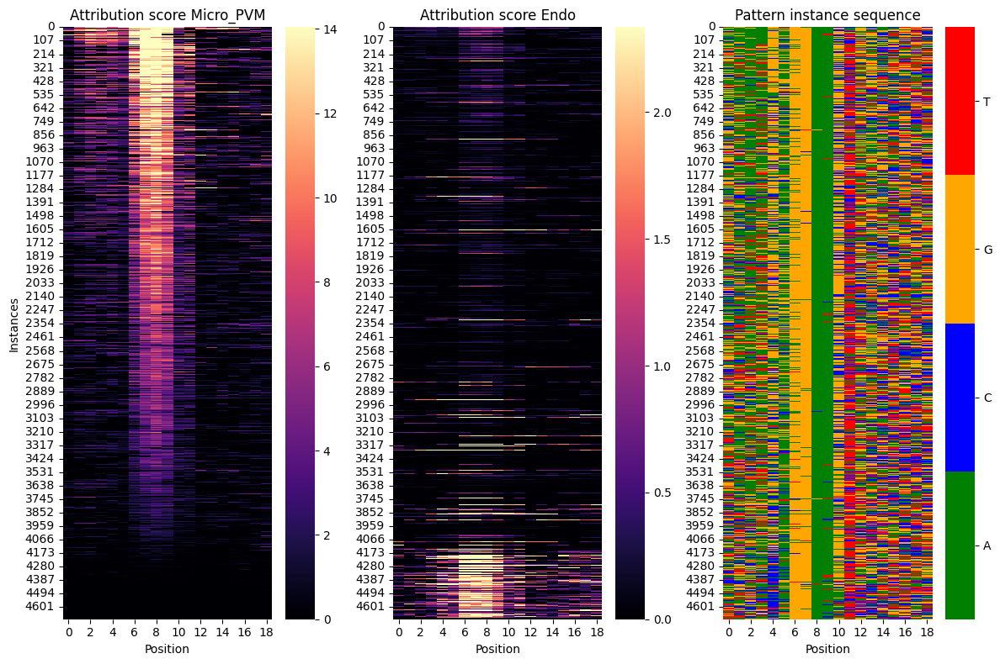

In [88]:
import matplotlib

nuc_to_color = {"A": "#008000", "C": "#0000ff", "G": "#ffa600", "T": "#ff0000"}
index_to_nuc = dict(zip(np.arange(4), list("ACGT")))
nuc_cmap = matplotlib.colors.LinearSegmentedColormap.from_list(
    "nuc", [nuc_to_color[index_to_nuc[i]] for i in range(4)], 4
)

sorted_idx = np.argsort(
    inst_cl[np.where(adata.obs_names == "Micro_PVM")[0][0]].max(2).mean(1)
)[::-1]

fig, axs = plt.subplots(ncols=3, figsize=(12, 8))
sns.heatmap(
    inst_cl[np.where(adata.obs_names == "Micro_PVM")[0][0]].sum(2)[sorted_idx],
    robust=True,
    vmin=0,
    cmap="magma",
    ax=axs[0],
)
sns.heatmap(
    inst_cl[np.where(adata.obs_names == "Endo")[0][0]].sum(2)[sorted_idx],
    robust=True,
    vmin=0,
    cmap="magma",
    ax=axs[1],
)
hm = sns.heatmap(
    oh_inst_cl.argmax(2)[sorted_idx],
    cmap=nuc_cmap,
    ax=axs[2],
    vmin=0,
    vmax=4,
    cbar_kws={"ticks": [0.5, 1.5, 2.5, 3.5]},
)
colorbar = hm.collections[0].colorbar
colorbar.set_ticks([0.5, 1.5, 2.5, 3.5])
colorbar.set_ticklabels(["A", "C", "G", "T"])
axs[0].set_title("Attribution score Micro_PVM")
axs[1].set_title("Attribution score Endo")
axs[2].set_title("Pattern instance sequence")
axs[0].set_ylabel("Instances")
for ax in axs:
    ax.set_xlabel("Position")
fig.tight_layout()
plt.show(fig)
plt.close(fig)

The left two plots shows the attribution score of all SPI instances in `Micro_PVM` and `Endo`, the values are sorted based on the attribution score for `Micro_PVM`

The right plot visualzes the sequence of each instance.

From this it seems that instances of the form `GAGGAA` give a higher attribution score compared to instances of the form `CAGGAA` in `Micro_PVM` and vice versa for `Endo`

## Hit scoring

Let's find hits of SPI across all cell type specific peaks, for this we will use fimo implemented in memelite.

In [89]:
from memelite import fimo

We will score each pattern in the SPI cluster individually.

In [95]:
SPI_pattern_names = pattern_adata.obs.query("sub_cluster == @cluster").index.to_list()
print(", ".join(SPI_pattern_names))

SPI_patterns = {n: p for n, p in zip(pattern_names, patterns) if n in SPI_pattern_names}

Endo_pos_pattern_2, Micro_PVM_pos_pattern_0, Micro_PVM_neg_pattern_2


Get one hot encoded regions.

In [92]:
genome_file = "../../../mouse/biccn/mm10.fa"
chrom_sizes = "../../../mouse/biccn/mm10.chrom.sizes"
genome = crested.Genome(genome_file, chrom_sizes)

In [96]:
from crested.utils._seq_utils import one_hot_encode_sequence

all_one_hot = np.array(
    [
        one_hot_encode_sequence(
            genome.fetch(chrom=chrom, start=start, end=end), expand_dim=False
        )
        for _, (chrom, start, end) in adata.var[["chr", "start", "end"]].iterrows()
    ]
)

In [97]:
all_one_hot.shape

(91475, 2114, 4)

Calculate hits.

In [100]:
SPI_hits = fimo(
    motifs={
        n: SPI_patterns[n].ppm[slice(*SPI_patterns[n].ic_trim(ic_threshold))].T
        for n in SPI_patterns
    },
    sequences=all_one_hot.swapaxes(1, 2),
)
SPI_hits = pd.concat(SPI_hits)

For each hit we will calculate the sum of its attribution score.

In [122]:
all_attr = _explainer.saliency_map(
    X=all_one_hot,
    model=model,
    class_index=np.where(adata.obs_names == "Micro_PVM")[0][0],
)

In [124]:
all_attr_oh = all_attr * all_one_hot

In [156]:
SPI_hits["attr"] = [
    all_attr_oh[idx, start:end].mean()
    for _, (idx, start, end) in SPI_hits[["sequence_name", "start", "end"]].iterrows()
]

Let's visualize the location of each hit relative to the peak.

Most hits, **with a high attribution score**, fall within the middle ~200 bp.

In [287]:
thr = 0.3
window = 5

SPI_hits = SPI_hits.sort_values("start")
SPI_hits["passing_thr"] = abs(SPI_hits["attr"]) >= thr
SPI_hits["start_bins"] = pd.cut(
    SPI_hits["start"], bins=range(-1, model.input.shape[1], window)
)
n_hits_per_bin = SPI_hits.groupby("start_bins", observed=False)["passing_thr"].sum()

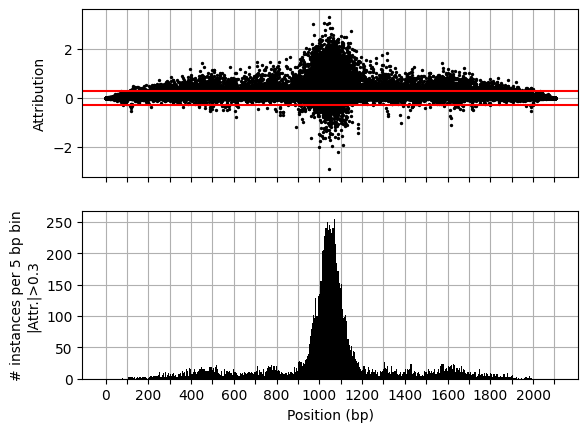

In [292]:
fig, axs = plt.subplots(nrows=2, sharex=True)
axs[0].scatter(SPI_hits["start"], SPI_hits["attr"], s=2, color="black")
axs[0].axhline(thr, color="red")
axs[0].axhline(-thr, color="red")
axs[1].bar(
    x=[x.left for x in n_hits_per_bin.index],
    height=n_hits_per_bin.values,
    width=window,
    color="black",
)
axs[1].set_xticks(
    np.arange(0, model.input.shape[1], 100),
    labels=[
        x if (x % 200 == 0) else "" for x in np.arange(0, model.input.shape[1], 100)
    ],
)
for ax in axs:
    ax.grid()
    ax.set_axisbelow(True)
axs[0].set_ylabel("Attribution")
axs[1].set_ylabel(f"# instances per {window} bp bin\n|Attr.|>{thr}")
axs[1].set_xlabel("Position (bp)")
plt.show(fig)
plt.close(fig)

## Visualize similarity of identified patterns and known-motifs from SCENIC+ motif collection

To visualize the breadth of motifs identified using CREsted we will compare them to the SCENIC+ motif collection, which contains motifs for almost all known transcription factors in human, mouse and fly.

For this we will first generate a dimensionality reduction of the SCENIC+ motif colleciton.

In [330]:
def load_motif(file_name: str) -> dict[str, np.ndarray]:
    motifs: dict[str, np.ndarray] = {}
    with open(file_name) as f:
        # initialize name
        name = f.readline().strip()
        if not name.startswith(">"):
            raise ValueError(f"First line of {file_name} does not start with '>'.")
        name = name.replace(">", "")
        pwm = []
        for line in f:
            line = line.strip()
            if line.startswith(">"):
                # we are at the start of a new motif
                motifs[name] = np.array(pwm)
                # scale values of motif
                motifs[name] = motifs[name].T / motifs[name].sum(1)
                # reset pwm and read new name
                name = line.replace(">", "")
                pwm = []
            else:
                # we are in the middle of reading the pwm values
                pwm.append([float(v) for v in line.split()])
        # add last motif
        motifs[name] = np.array(pwm)
        # scale values of motif
        motifs[name] = motifs[name].T / motifs[name].sum(1)
    return motifs

In [331]:
MOTIF_DIR = "../../../../motif_collection_public/v10nr_clust_public/singletons/"

known_motifs = {}
for motif_file in os.listdir(MOTIF_DIR):
    known_motifs = {**known_motifs, **load_motif(os.path.join(MOTIF_DIR, motif_file))}

In [332]:
len(known_motifs)

17995

In [335]:
pvals_known_motifs, _, _, _, _ = tomtom(
    Qs=list(known_motifs.values()), Ts=list(known_motifs.values())
)

In [336]:
adata_known_motifs = sc.AnnData(
    pvals_known_motifs, obs=pd.DataFrame(index=known_motifs.keys())
)

sc.tl.pca(adata_known_motifs)
sc.pp.neighbors(adata_known_motifs, n_neighbors=50)
sc.tl.tsne(adata_known_motifs, perplexity=50)

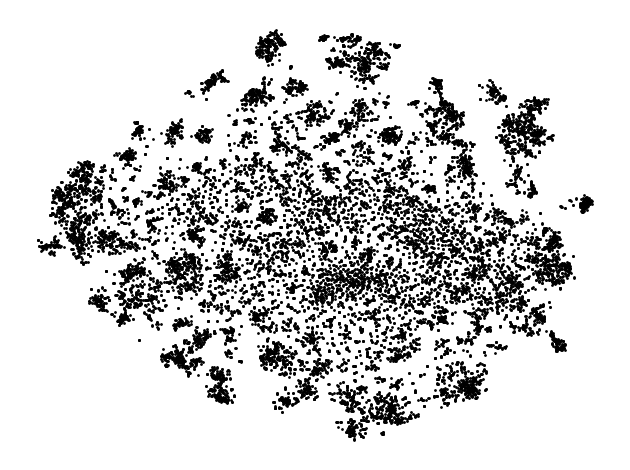

In [340]:
fig, ax = plt.subplots()
ax.scatter(
    adata_known_motifs.obsm["X_tsne"][:, 0],
    adata_known_motifs.obsm["X_tsne"][:, 1],
    color="black",
    s=1,
)
ax.set_axis_off()
fig.tight_layout()
plt.show(fig)
plt.close(fig)

Finally we plot the similarity of all identified motifs on this map to visualize the breadth of identified motifs.

In [382]:
sim, _, _, _, _ = tomtom(
    Qs=[p.ppm[slice(*p.ic_trim(ic_threshold))].T for p in combined_patterns],
    Ts=list(known_motifs.values()),
)

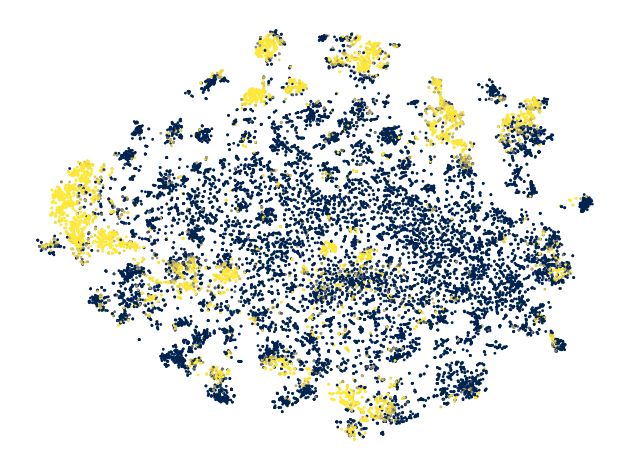

In [407]:
fig, ax = plt.subplots()
v = -np.log1p(sim.min(0))
s_idx = np.argsort(v)
ax.scatter(
    adata_known_motifs.obsm["X_tsne"][:, 0],
    adata_known_motifs.obsm["X_tsne"][:, 1],
    c=v,
    s=1,
    vmin=-np.log1p(1e-3),
    cmap="cividis",
)
ax.set_axis_off()
fig.tight_layout()
plt.show(fig)
plt.close(fig)